#  Название проекта: Рынок заведений общественного питания Москвы

**Описание исследования.**
Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.


**Цель исследования.**

Подготовить презентацию с результами исследования для инвесторов.

**Задачи исследования.**

- выгрузит датасет и изучить общую информацию;
- подготовьте данные: проверить названия столбцов, проверьть пропуски и типы данных, проверить дубликаты;
- изучить данные;
- провести анализ заведений общественного питания Москвы;
- детализировать исследование: открытие кофейни;
- сделать выводы и рекомендации.

**Исходные данные.**

В нашем распоряжении датасет:
 - **moscow_places.csv** - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.
 
Структура **moscow_places.csv:**

- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat - широта географической точки, в которой находится заведение;
- lng - долгота географической точки, в которой находится заведение;
- rating -  рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price - категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill - строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
        и так далее;
- middle_avg_bill - число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт;
- middle_coffee_cup - число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт;
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым;
- district - административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.


**Данное исследование разделим на несколько частей.**

***Часть 1. Изучение общей информации и подготовка данных:***

* [1. Изучение файлов с данными, получение общей информации, загрузка библиотек ](#1.1-bullet)
* [2. Обработка дубликатов](#1.2-bullet)
* [3. Обработка пропусков](#1.3-bullet)
* [4. Обработка типов данных](#1.4-bullet)
* [5. Предобработка данных](#1.5-bullet)
* [6. Изучение аномалий](#1.6-bullet)

***Часть 2. Анализ заведений общественного питания Москвы:***

* [1. Категории заведений](#2.1-bullet)
* [2. Посадочные места](#2.2-bullet)
* [3. Соотношение сетевых и несетевых заведений](#2.3-bullet)
* [4. Топ-15 популярных сетей в Москве](#2.4-bullet)
* [5. Административные районы Москвы](#2.5-bullet)
* [6. Распределение средних рейтингов по категориям заведений](#2.6-bullet)
* [7. Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района](#2.7-bullet)
* [8. Все заведения датасета на карте](#2.8-bullet)
* [9. Топ-15 улиц по количеству заведений](#2.9-bullet)
* [10. Один объект общепита на улице](#2.10-bullet)
* [11. Средний чек заведений по районам](#2.11-bullet)

***Часть 3. Детализируем исследование: открытие кофейни***

* [1. Количество кофеен в датасете](#3.1-bullet)
* [2. Круглосуточные кофейни](#3.2-bullet)
* [3. Рейтинги кофеен](#3.3-bullet)
* [4. Стоимость чашки капучино](#3.4-bullet)
* [5. Вывод по разделу](#3.5-bullet)

[***Презентация исследования для инвесторов***](#4-bullet)

[***ВЫВОД***](#5-bullet)

## Загрузка данных и подготовка их к анализу

In [1]:
# импортировали библиотеки Pyhton для проведения исследования
import pandas as pd 
import seaborn as sns 
from matplotlib import pyplot as plt
import numpy as np
from pandas.plotting import register_matplotlib_converters
import plotly.express as px
import plotly.graph_objs as go
from folium import Map, Choropleth, Marker
import re
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
import warnings
warnings.filterwarnings('ignore')

<a id='1.1-bullet'></a>
### Считывание CSV-файлов с данными с помощью библиотеки pandas

In [2]:
# считали файл из csv-файла в переменную
try:
    places = pd.read_csv('moscow_places.csv')
except:
    places = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
# создали функцию для просмотра и вывода информации датафрейма
def info(df):
    display(df.head(10))
    print(df.info(), '*'*50, sep='\n')
    print(df.duplicated().sum(), '*'*50, sep='\n');

In [4]:
info(places)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
None
**************************************************
0
***

В датафрейме 8406 строк и 14 столбцов. Есть пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Типы данных записаны корректно, кроме столбца seats - количество посадочных мест не может быть дробным заменем на целочисленное. Также не найдены явные дубликаты, далее поищем не явные дубликаты. Названия столбцов записаны в змеином регистре.

<a id='1.2-bullet'></a>
### Обработка дубликатов

In [5]:
#переведем в нижний регистр все значения для удобства и поиска дубликатов
places['name'] = places['name'].str.lower()
places['address'] = places['address'].str.lower()

In [6]:
#ранее не были выявлены явные дубликаты
places.duplicated().sum()

0

In [7]:
#поискали неявные дубликаты по названию и адресу
places.duplicated(subset = ['name', 'address']).sum()

4

Нашли 4 неявных дубликата

In [8]:
#посмотрим на неявные дубликаты
places[places.duplicated(subset = ['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
189,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 09:00–23:00",55.880327,37.530786,3.2,NaN,NaN,NaN,NaN,0,NaN
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1430,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"москва, проспект мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"москва, ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Есть отличия у одних и тех же заведений в категории либо во времени работы.

In [9]:
#удалили неявные дубликаты
places = places.drop_duplicates(subset = ['name', 'address'])
places.duplicated(subset = ['name', 'address']).sum() #проверили удаление

0

<a id='1.3-bullet'></a>
### Обработка пропусков

Проанализируем пропуски в столбцах, построим тепловую карту пропусков и выведем процент пропущенных значений по столбцам

In [10]:
#задали начальное количество значений в датафрейме
before = places.shape[0]
before

8402

In [11]:
skip = places.isna().sum() # посчитали количество пропусков в столбцах
skip

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5087
avg_bill             4586
middle_avg_bill      5253
middle_coffee_cup    7867
chain                   0
seats                3610
dtype: int64

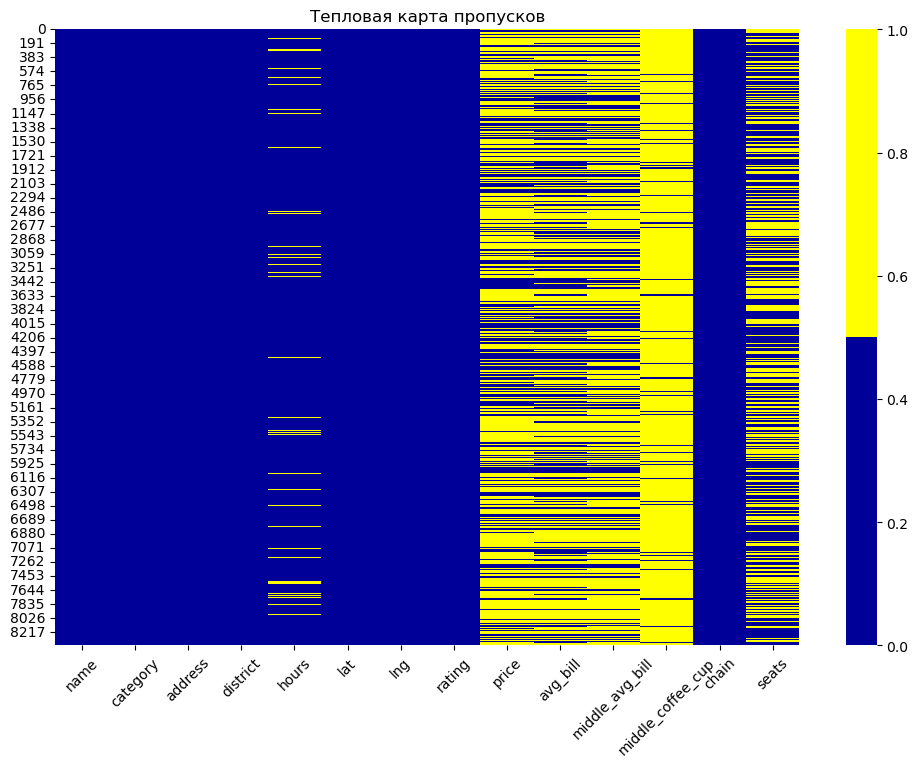

In [12]:
# построли тепловую карту пропусков
plt.figure(figsize=(12, 8))
cols = places.columns # записали признаки в переменную cols
# определяем цвета 
# желтый - пропущенные данные, синий - не пропущенные
colours = ['#000099', '#ffff00'] 
sns.heatmap(places[cols].isnull(), cmap=sns.color_palette(colours))
plt.title('Тепловая карта пропусков')
plt.xticks(rotation=45);

In [13]:
# посчитали процентное соотношение количества пропусков
places.shape[0] # посчитали сколько всего значений может быть в столбце
for index in range(len(skip)):
    print('Пропущено значений в столбцe {} - {:.1%}'.format(cols[index], skip[index] / before))

Пропущено значений в столбцe name - 0.0%
Пропущено значений в столбцe category - 0.0%
Пропущено значений в столбцe address - 0.0%
Пропущено значений в столбцe district - 0.0%
Пропущено значений в столбцe hours - 6.4%
Пропущено значений в столбцe lat - 0.0%
Пропущено значений в столбцe lng - 0.0%
Пропущено значений в столбцe rating - 0.0%
Пропущено значений в столбцe price - 60.5%
Пропущено значений в столбцe avg_bill - 54.6%
Пропущено значений в столбцe middle_avg_bill - 62.5%
Пропущено значений в столбцe middle_coffee_cup - 93.6%
Пропущено значений в столбцe chain - 0.0%
Пропущено значений в столбцe seats - 43.0%


Больше 50 % пропусков в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup

In [14]:
#удалили строки, во всех столбцах с пропущенными значениями, в которых есть пропуски
places = (
    places[~(
          (places['hours'].isna())
           &(places['price'].isna())
           &(places['avg_bill'].isna())
           &(places['middle_avg_bill'].isna())
           &(places['middle_coffee_cup'].isna())
           &(places['seats'].isna())
    )
          ]
)

#### Обработка пропусков в столбце 'hours'

In [15]:
places['hours'].isna().sum()

300

In [16]:
hours = places.pivot_table(index='category', columns='hours', values='name', aggfunc='count')
hours

hours,Нет информации,"вт 08:30–17:00; ср,чт 12:00–20:30; пт 08:30–17:00; сб 09:00–16:30",вт 13:00–21:00; ср 11:00–20:00; чт 13:00–21:00; пт-вс 11:00–20:00,"вт,чт 10:00–18:00","вт,чт,пт,сб,вс 08:00–23:00",вт-вс 09:00–19:00,вт-вс 09:00–21:00,вт-вс 10:00–18:00,вт-вс 10:00–20:00,вт-вс 10:00–21:00,...,"ср,чт 13:00–01:00; пт,сб 13:00–05:00; вс 13:00–03:00","ср,чт 14:00–00:00; пт,сб 14:00–06:00; вс 14:00–00:00",ср-вс 09:00–21:00,ср-вс 10:00–17:30,"ср-пт 10:00–18:00; сб,вс 10:00–19:00",ср-пт 15:00–00:00,"чт 18:00–00:00; пт,сб 15:00–06:00; вс 15:00–00:00","чт 20:00–02:00; пт,сб 20:00–06:00","чт круглосуточно, перерыв 10:00–20:00; сб круглосуточно",чт-вс 20:00–06:00
category,,,,,,,,,,,,,,,,,,,,,
"бар,паб",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.0,NaN,NaN,NaN,NaN,1.0,1.0,NaN,NaN,1.0
булочная,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
быстрое питание,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
кафе,1.0,NaN,NaN,NaN,1.0,NaN,NaN,1.0,3.0,1.0,...,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,1.0,NaN
кофейня,NaN,1.0,1.0,1.0,NaN,NaN,1.0,NaN,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
пиццерия,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ресторан,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,1.0,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN
столовая,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Видим огромное разнообразие времени работы заведений, искать по конкретному заведению информацию не представляется возможным, можно потратить много времени на поиски. Заполним данные пропуски заглушкой "Нет информации"

In [17]:
#заполнили заглушкой
places['hours'] = places['hours'].fillna('Нет информации')

#### Обрабока пропусков в столбце seats

In [18]:
#вывели минимальное, максимальное, среднее и медианное значение в столбце
seats = (places
         .groupby('category', as_index=False)
         .agg({'seats': ['min', 'max', 'mean', 'median']})
         .sort_values(by=('seats', 'median'), ascending=True)
)
seats.columns = ['category', 'seats_min', 'seats_max', 'seats_mean', 'seats_median']
seats = np.round(seats) #округлили до целых чисел
seats

,category,seats_min,seats_max,seats_mean,seats_median
1,булочная,0.0,625.0,89.0,50.0
5,пиццерия,0.0,1288.0,94.0,55.0
3,кафе,0.0,1288.0,97.0,60.0
2,быстрое питание,0.0,1040.0,99.0,65.0
7,столовая,0.0,1200.0,100.0,76.0
4,кофейня,0.0,1288.0,111.0,80.0
0,"бар,паб",0.0,1288.0,124.0,82.0
6,ресторан,0.0,1288.0,122.0,86.0


In [19]:
#вывели статистику по данному столбцу
places['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

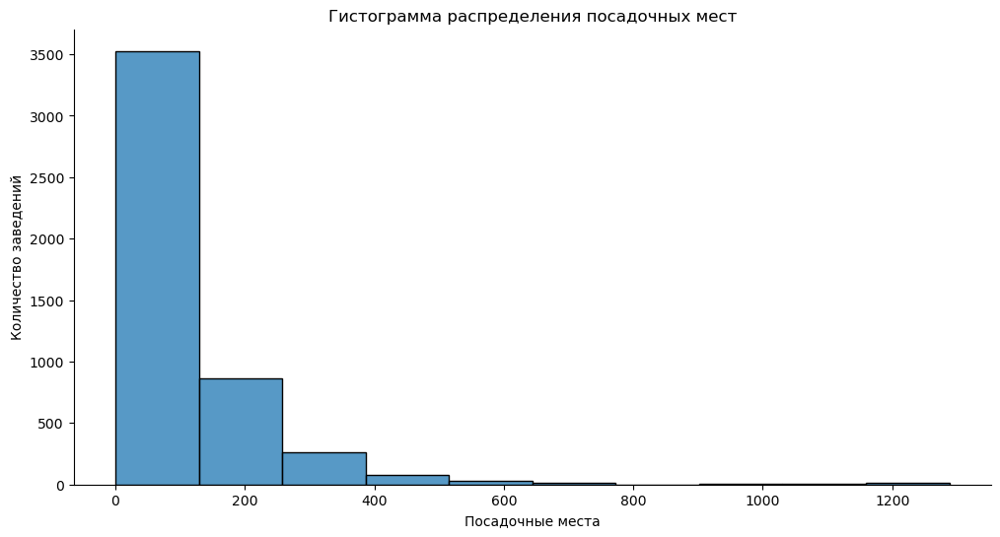

In [20]:
# построили гистограмму рапределения посадочных мест
places1 = places
plt.figure(figsize=(12, 6))
ax1 = sns.histplot(data=places1, 
             x='seats',
             bins=10
            )
sns.despine()

plt.title('Гистограмма распределения посадочных мест')
plt.xlabel('Посадочные места')
plt.ylabel('Количество заведений')
plt.grid(False)
plt.show()

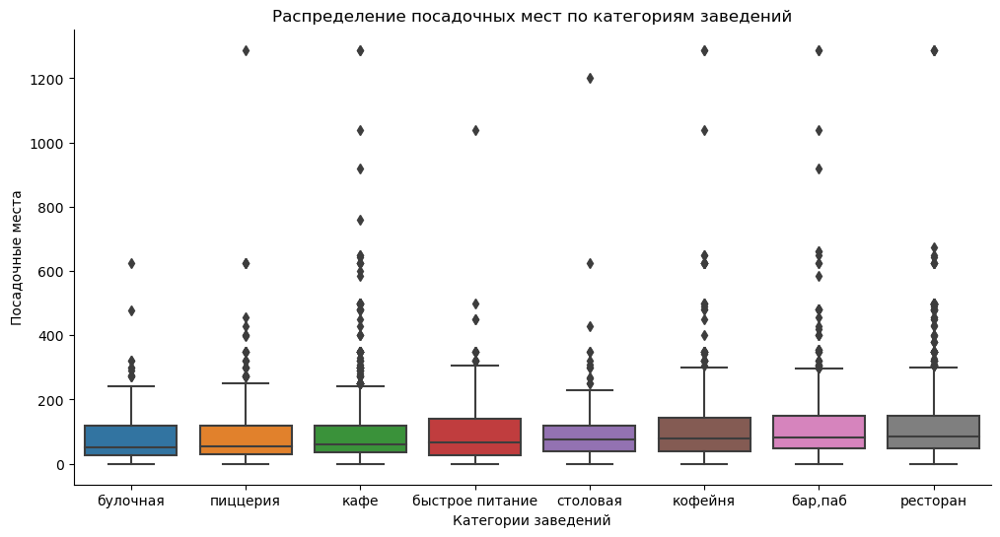

In [21]:
#визуализировали выбросы по столбцу seat
plt.figure(figsize=(12, 6))
sns.boxplot(x='category', 
            y='seats', 
            data=places,
            order=(places
                   .groupby('category')['seats']
                   .median()
                   .sort_values().index
                  )
           )
sns.despine()

plt.title('Распределение посадочных мест по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Посадочные места')
plt.grid(False)
plt.xticks(rotation=0)
plt.show()

Видим аномально большие значения посадочных мест, а также заведения, где посадочные места вообще отсуюствуют. Для нашего исследования данные заведения удалим.

In [22]:
#удалили выбросы в данном столбце 
places = places[~((places['seats'] >= 400)|((places['seats'] < 1)))]

In [23]:
#заполнили пропуски медианным значением 
for t in places['category'].unique():
    places.loc[(places['category'] == t) & (places['seats'].isna()), 'seats'] = \
    places.loc[(places['category'] == t), 'seats'].median()

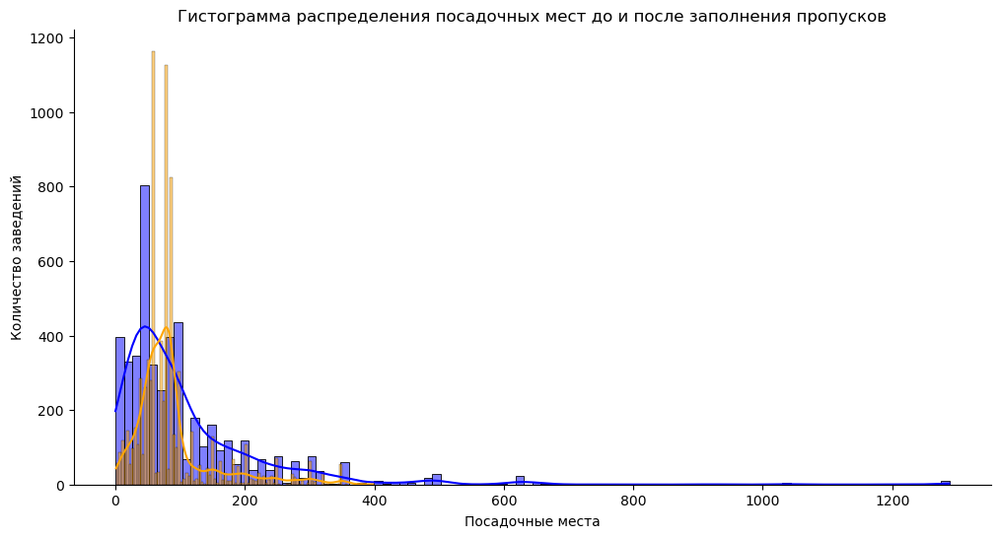

In [24]:
# построили гистограмму распределения посадочных мест до заполнения пропусков и после
plt.figure(figsize=(12, 6))

ax = sns.histplot(data=places1, 
             x='seats',
             bins=100,
             color='blue', 
             alpha=0.5, 
             kde=True, 
             label='First Class'
            )
ax1 = sns.histplot(data=places, 
             x='seats',
             bins=100,
             color='orange', 
             alpha=0.5, 
             kde=True, 
             label='Third Class'
            )
sns.despine()

plt.title('Гистограмма распределения посадочных мест до и после заполнения пропусков')
plt.xlabel('Посадочные места')
plt.ylabel('Количество заведений')
plt.grid(False)
plt.show()

Плотность распределения смешается в сторону медианных значений, которыми были заполнены пропуски.

#### Обработка пропусков в столбцах price, avg_bill, middle_avg_bill, middle_coffee_cup

In [25]:
#вывели пропуски в столбцах
places.isna().sum()

name                    0
category                0
address                 0
district                0
hours                   0
lat                     0
lng                     0
rating                  0
price                4668
avg_bill             4197
middle_avg_bill      4842
middle_coffee_cup    7385
chain                   0
seats                   0
dtype: int64

Поиск информации для заполнения пропусков в данных столбцах потребует значительное количество временных ресурсов и может не повлиять на исследование. Заполнил данные пропуски заглушкой.

In [26]:
#заполнили пропуски заглушкой
places[['price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup']] = \
places[['price', 'avg_bill', 'middle_avg_bill', 'middle_coffee_cup']].fillna(-1)

In [27]:
#проверили на отсутсвие пропусков
places.isna().sum()

name                 0
category             0
address              0
district             0
hours                0
lat                  0
lng                  0
rating               0
price                0
avg_bill             0
middle_avg_bill      0
middle_coffee_cup    0
chain                0
seats                0
dtype: int64

In [28]:
after = places.shape[0]
after

7899

In [29]:
before - after

503

In [30]:
'Потеряли значений после обработки аномалий - {:.1%}'.format((before-after)/before)

'Потеряли значений после обработки аномалий - 6.0%'

<a id='1.4-bullet'></a>
### Обработка типов данных

Столбец seats - количество посадочных мест представлен как дробное значение, заменем на целочисленное

In [31]:
#изменили тип данных в столбце seats
places['seats'] = places['seats'].astype('int')

In [32]:
#проверили корретность типов данных
places.dtypes

name                  object
category              object
address               object
district              object
hours                 object
lat                  float64
lng                  float64
rating               float64
price                 object
avg_bill              object
middle_avg_bill      float64
middle_coffee_cup    float64
chain                  int64
seats                  int32
dtype: object

<a id='1.5-bullet'></a>
### Предобработка данных

Создадим столбец street с названиями улиц из столбца с адресом.

In [33]:
# создали столбец 'street'
places['street'] = places['address'].str.split(', ').str[1].str.strip()
places.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,-1,-1,-1.0,-1.0,0,60,улица дыбенко
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,улица дыбенко
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45,клязьминская улица
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,-1,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,80,улица маршала федоренко
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148,правобережная улица


In [34]:
# выделить часть улицы из адреса можно с помощью регулярных выражений и поискать отличия
words = ['улица', 'улица ', 'ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия', 'мкад', 'просек', 'парк', 'шоссе']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

places['street1'] = places['address'].str.extract(str_pat, flags=re.I)
places[places['street'] != places['street1']][['address', 'street', 'street1']]

,address,street,street1
25,"москва, парк левобережный",парк левобережный,NaN
60,"москва, ландшафтный заказник лианозовский",ландшафтный заказник лианозовский,NaN
64,"москва, лианозовский парк культуры и отдыха",лианозовский парк культуры и отдыха,NaN
73,"москва, парк алтуфьево",парк алтуфьево,NaN
137,"москва, парк ангарские пруды",парк ангарские пруды,NaN
...,...,...,...
8259,"москва, юго-восточный административный округ, ...",юго-восточный административный округ,NaN
8262,"москва, юго-восточный административный округ, ...",юго-восточный административный округ,NaN
8266,"москва, юго-восточный административный округ, ...",юго-восточный административный округ,NaN
8299,"москва, юго-восточный административный округ, ...",юго-восточный административный округ,NaN


Создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

логическое значение **True** — если заведение работает ежедневно и круглосуточно;

логическое значение **False** — в противоположном случае.

In [35]:
#создали столбец 'is_24_7'
places['is_24_7'] = False
places.loc[places['hours'] == 'ежедневно, круглосуточно', 'is_24_7'] = True
places

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street1,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,-1,-1,-1.0,-1.0,0,60,улица дыбенко,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,-1.0,0,4,улица дыбенко,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,-1.0,0,45,клязьминская улица,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,-1,Цена чашки капучино:155–185 ₽,-1.0,170.0,0,80,улица маршала федоренко,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,-1.0,1,148,правобережная улица,правобережная улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,суши мания,кафе,"москва, профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,-1,-1,-1.0,-1.0,0,86,профсоюзная улица,профсоюзная улица,False
8402,миславнес,кафе,"москва, пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,-1,-1,-1.0,-1.0,0,150,пролетарский проспект,пролетарский проспект,False
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,-1,Средний счёт:от 150 ₽,150.0,-1.0,0,150,люблинская улица,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,-1,-1,-1.0,-1.0,1,150,люблинская улица,люблинская улица,True


В данном разделе загрузили данные, посмотрели на них. Предобработали неявные дубликаты, типы данных и пропуски. Пропуски заполнили в столбце seats медианным значением по категориям, в остальных столбцах заполнение пропусков считаю не целесообразным, так как потребуется потратить много времени на поиск информации. Создали столбцы с названиями улиц и с обозначением работает ли заведение круглосуточно.

<a id='1.6-bullet'></a>
### Изучение аномалий

#### Столбец rating

Изучим данные в столбце rating

In [36]:
#выведем статистику по столбцу rating
places['rating'].describe()

count    7899.000000
mean        4.239815
std         0.457706
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

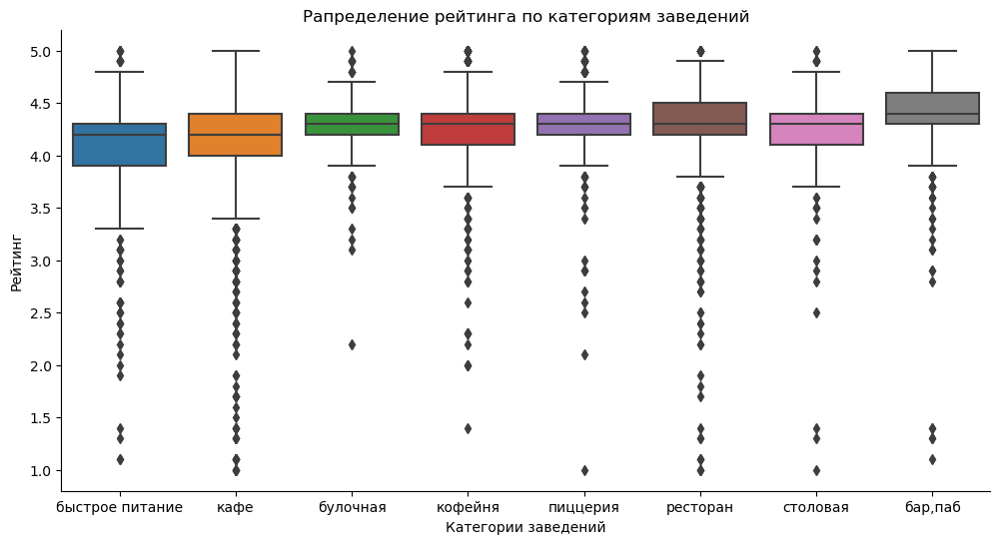

In [37]:
#визуализировали выбросы по столбцу rating
plt.figure(figsize=(12, 6))
sns.boxplot(x='category', 
            y='rating', 
            data=places,
            order=(places
                   .groupby('category')['rating']
                   .median()
                   .sort_values().index
                  )
           )
sns.despine()

plt.title('Рапределение рейтинга по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг')
plt.grid(False)
plt.xticks(rotation=0)
plt.show()

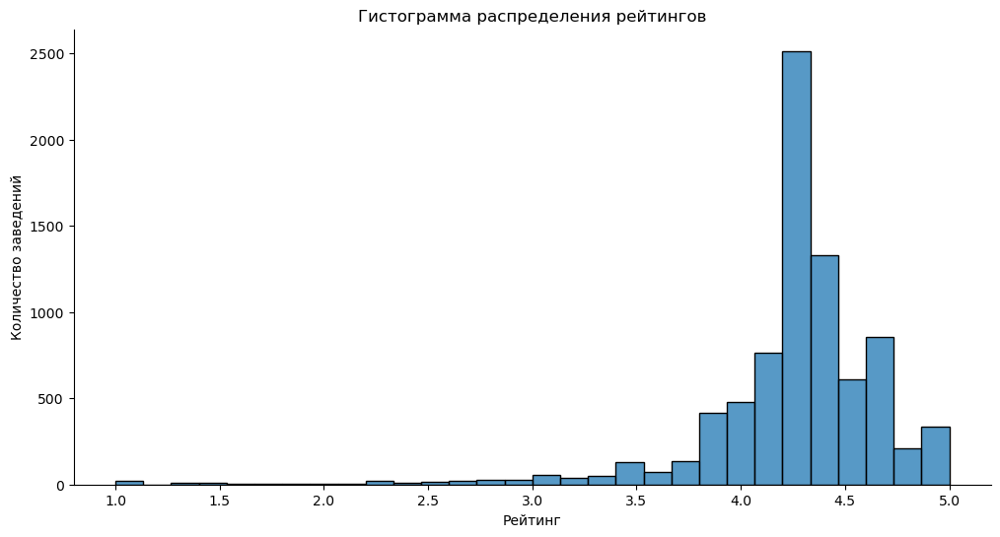

In [38]:
# построили гистограмму рапределения рейтинга
plt.figure(figsize=(12, 6))
ax1 = sns.histplot(data=places1, 
             x='rating',
             #hue='category',
             bins=30
            )
sns.despine()

plt.title('Гистограмма распределения рейтингов')
plt.xlabel('Рейтинг')
plt.ylabel('Количество заведений')
plt.grid(False)
plt.show()

Рейтинг распределен от 1.0 до 5.0. Большинство оценок в диапазоне 4.1 - 4.4. Диаграмма смешена вправо с длинным хвостом слева. Можно сказать, что клиенты в основном ставят оценки выше 4.0.

#### Столбец middle_avg_bill

Изучим данные в столбце middle_avg_bill

In [39]:
#выведем статистику по столбцу middle_avg_bill
places.query('middle_avg_bill != -1')['middle_avg_bill'].describe()

count     3057.000000
mean       958.290808
std       1018.095148
min          0.000000
25%        375.000000
50%        750.000000
75%       1250.000000
max      35000.000000
Name: middle_avg_bill, dtype: float64

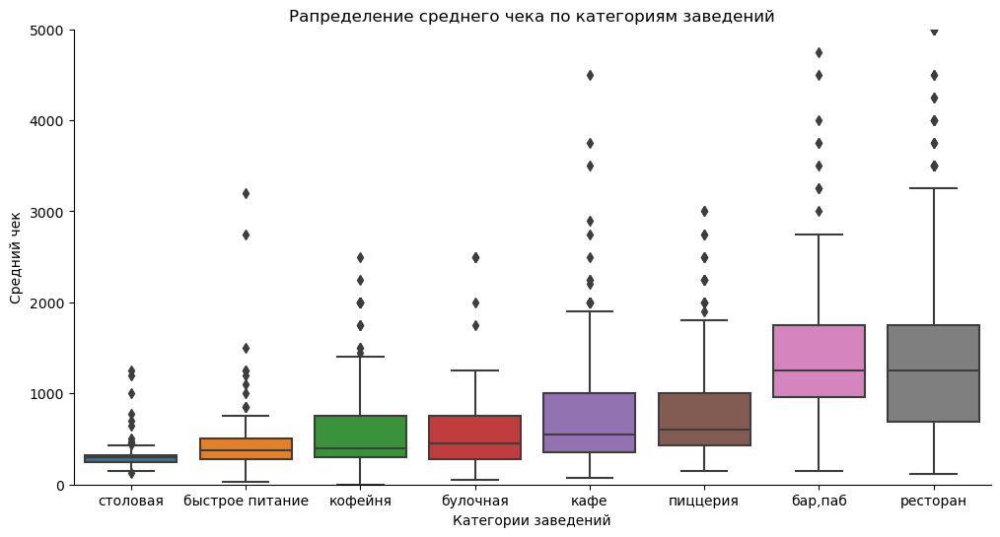

In [40]:
#визуализировали выбросы по столбцу middle_avg_bill
plt.figure(figsize=(12, 6))

fig = sns.boxplot(x='category', 
            y='middle_avg_bill', 
            data=places.query('middle_avg_bill != -1'),
            order=(places
                   .query('middle_avg_bill != -1')
                   .groupby('category')['middle_avg_bill']
                   .median()
                   .sort_values().index
                  )
           )
sns.despine()
fig.axis(ymin=0, ymax=5000)

plt.title('Рапределение среднего чека по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Средний чек')
plt.grid(False)
plt.xticks(rotation=0)
plt.show()

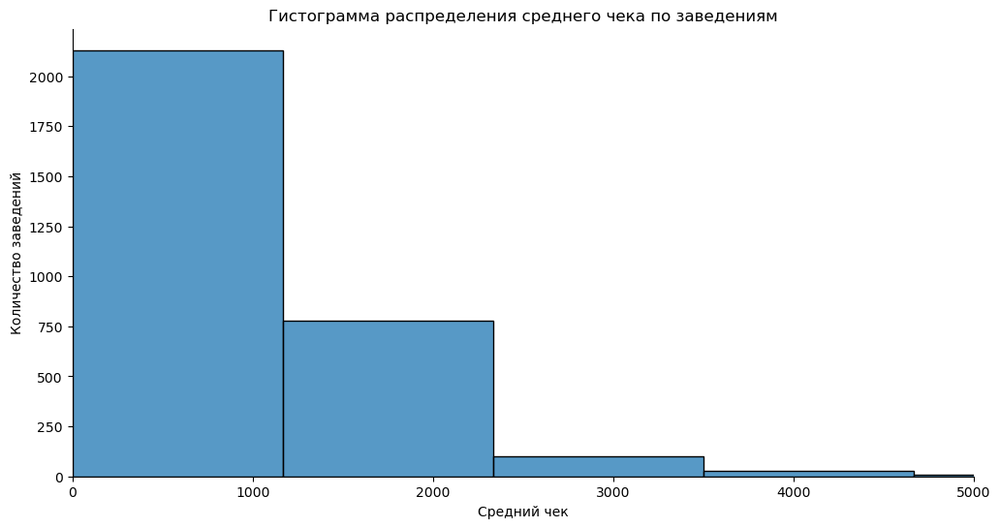

In [41]:
# построили гистограмму рапределения среднего чека
plt.figure(figsize=(12, 6))

fig = sns.histplot(data=places.query('middle_avg_bill != -1'), 
             x='middle_avg_bill',
             bins=30
            )
sns.despine()
fig.axis(xmin=0, xmax=5000)
plt.title('Гистограмма распределения среднего чека по заведениям')
plt.xlabel('Средний чек')
plt.ylabel('Количество заведений')
plt.grid(False)
plt.show()

In [42]:
#посмотрели на аномальные значения в столбце средний чек
places.query('middle_avg_bill == 0 or middle_avg_bill > 5000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street1,is_24_7
730,чойхона,"бар,паб","москва, дмитровское шоссе, 95а",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,-1.0,0,49,дмитровское шоссе,дмитровское шоссе,False
2795,крошка картошка,быстрое питание,"москва, щёлковское шоссе, вл75",Восточный административный округ,"ежедневно, 10:00–22:00",55.811160,37.799823,4.0,высокие,Средний счёт:1000–10000 ₽,5500.0,-1.0,1,70,щёлковское шоссе,щёлковское шоссе,False
3038,беллини,ресторан,"москва, рублёвское шоссе, 28",Западный административный округ,"ежедневно, 12:00–00:00",55.747632,37.425631,4.3,высокие,Средний счёт:5000–5500 ₽,5250.0,-1.0,0,150,рублёвское шоссе,рублёвское шоссе,False
3396,марио,ресторан,"москва, улица климашкина, 17",Центральный административный округ,"ежедневно, 12:00–00:00",55.767792,37.568453,4.5,высокие,Средний счёт:7000 ₽,7000.0,-1.0,0,100,улица климашкина,улица климашкина,False
3487,800°с contemporary steak,ресторан,"москва, большой патриарший переулок, 6, стр. 1",Центральный административный округ,"ежедневно, 09:00–23:30",55.762708,37.592138,4.7,высокие,Средний счёт:6000–8000 ₽,7000.0,-1.0,0,75,большой патриарший переулок,большой патриарший переулок,False
3518,чайка,ресторан,"москва, краснопресненская набережная, 12а",Центральный административный округ,"ежедневно, 12:00–00:00",55.752857,37.556365,4.8,высокие,Средний счёт:5000–8000 ₽,6500.0,-1.0,1,250,краснопресненская набережная,краснопресненская набережная,False
3603,lucky izakaya bar,"бар,паб","москва, калашный переулок, 9",Центральный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.757313,37.599581,4.8,высокие,Средний счёт:5500 ₽,5500.0,-1.0,0,80,калашный переулок,калашный переулок,False
3688,кофемания,кофейня,"москва, улица новый арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,-1.0,1,200,улица новый арбат,улица новый арбат,True
3882,white rabbit,ресторан,"москва, смоленская площадь, 3",Центральный административный округ,"ежедневно, 12:00–00:00",55.747608,37.581248,4.9,высокие,Средний счёт:7000–7500 ₽,7250.0,-1.0,0,150,смоленская площадь,смоленская площадь,False
3910,кантинетта антинори,ресторан,"москва, денежный переулок, 20",Центральный административный округ,"ежедневно, 12:00–00:00",55.745383,37.586595,4.7,высокие,Средний счёт:6000 ₽,6000.0,-1.0,0,80,денежный переулок,денежный переулок,False


In [43]:
#удалили аномальные значения равным 0 и более 5000
places = places[~((places['middle_avg_bill'] == 0)|(places['middle_avg_bill'] > 5000))]

В столбце со средним чеком обнаружили, что есть заведение, где средний чек равен 0 - явная ошибка. Для целей исследования также удалили выбросы по среднему чеку более 5000 рублей.

#### Столбец middle_coffee_cup	

Изучим данные в столбце middle_coffee_cup

In [44]:
#выведем статистику по столбцу middle_coffee_cup
places.query('middle_coffee_cup != -1')['middle_coffee_cup'].describe()

count     514.000000
mean      175.439689
std        90.169568
min        60.000000
25%       124.250000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

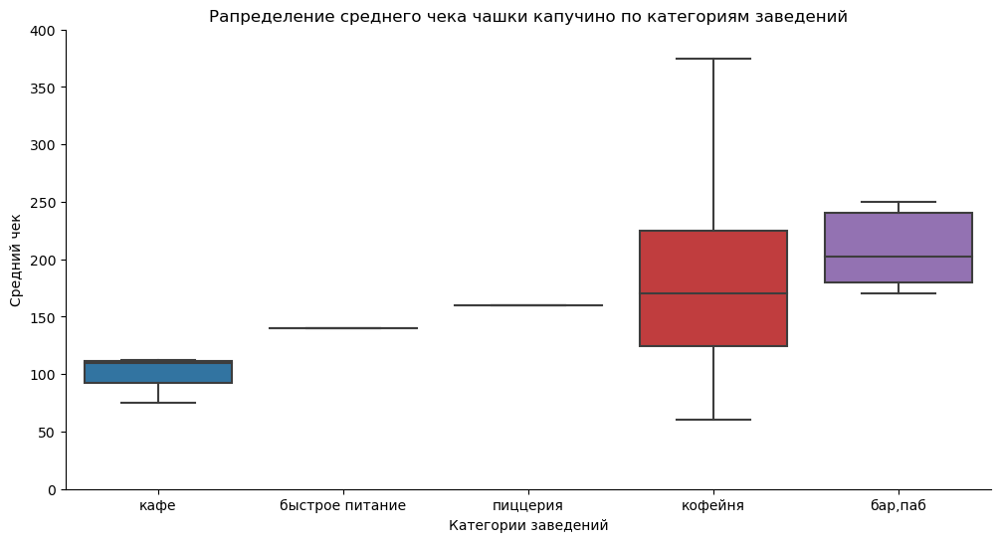

In [45]:
#визуализировали выбросы по столбцу  middle_coffee_cup
plt.figure(figsize=(12, 6))

fig = sns.boxplot(x='category', 
            y='middle_coffee_cup', 
            data=places.query('middle_coffee_cup != -1'),
            order=(places
                   .query('middle_coffee_cup != -1')
                   .groupby('category')['middle_coffee_cup']
                   .median()
                   .sort_values().index
                  )
           )
sns.despine()
fig.axis(ymin=0, ymax=400)

plt.title('Рапределение среднего чека чашки капучино по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Средний чек')
plt.grid(False)
plt.xticks(rotation=0)
plt.show()

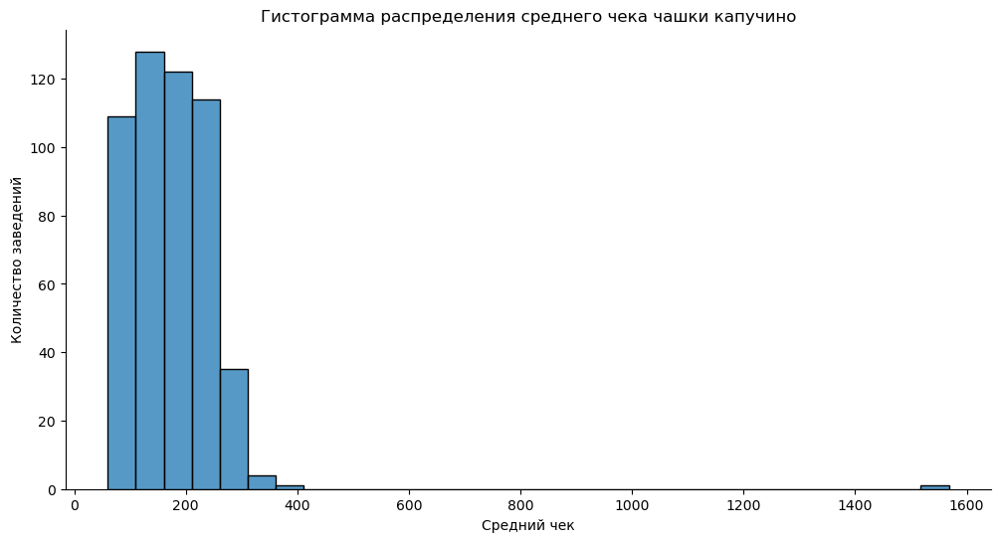

In [46]:
# построили гистограмму рапределения среднего чека чашки капучино
plt.figure(figsize=(12, 6))

fig = sns.histplot(data=places.query('middle_coffee_cup != -1'), 
             x='middle_coffee_cup',
             bins=30
            )
sns.despine()
#fig.axis(xmin=0, xmax=5000)
plt.title('Гистограмма распределения среднего чека чашки капучино')
plt.xlabel('Средний чек')
plt.ylabel('Количество заведений')
plt.grid(False)
plt.show()

In [47]:
#посмотрели на аномально большой средний чек чашки капучино
places.query('middle_coffee_cup > 400')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street1,is_24_7
2859,шоколадница,кофейня,"москва, большая семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,-1.0,1568.0,1,48,большая семёновская улица,большая семёновская улица,False


In [48]:
#посмотрели на заведения из категорий быстрое питание и пиццерия, которые продают капучино
places.query('(category == "быстрое питание" or category == "пиццерия") and middle_coffee_cup > 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street1,is_24_7
6489,кофе с собой,быстрое питание,"москва, волгоградский проспект, 45",Юго-Восточный административный округ,пн-пт 08:00–18:00,55.713091,37.720798,4.2,-1,Цена чашки капучино:100–180 ₽,-1.0,140.0,1,70,волгоградский проспект,волгоградский проспект,False
6984,профессор пуф,пиццерия,"москва, новочерёмушкинская улица, 53а",Юго-Западный административный округ,"ежедневно, 08:00–20:00",55.671831,37.569531,4.2,средние,Цена чашки капучино:от 160 ₽,-1.0,160.0,1,55,новочерёмушкинская улица,новочерёмушкинская улица,False


In [49]:
#удалим аномально большой чек чашки капучино
places = places[~(places['middle_coffee_cup'] > 400)]

In [50]:
after = places.shape[0]
after

7886

In [51]:
before - after

516

In [52]:
'Потеряли значений после обработки аномалий - {:.1%}'.format((before-after)/before)

'Потеряли значений после обработки аномалий - 6.1%'

В данном разделе посмотрели подробнее на аномалии в числовых столбцах: rating, midle_avg_bill, midle_coffee_cup. Для целей исследования удалили их из датасета. 

## Анализ заведений общественного питания Москвы

<a id='2.1-bullet'></a>
### Категории заведений

Исследуем какие категории заведений представлены в данных, количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализацию и ответим на вопрос о распределении заведений по категориям.

In [53]:
#вывели уникальные категории заведений
places['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [54]:
#вывели стандартную палитру библиотеки
print(sns.color_palette().as_hex())

['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']


In [55]:
#задали каждой категории свой цвет
category_colors = {
    'кафе': '#1f77b4',
    'ресторан': '#ff7f0e',
    'кофейня': '#2ca02c',
    'пиццерия': '#d62728',
    'бар,паб': '#9467bd',
    'быстрое питание': '#8c564b',
    'булочная': '#e377c2',
    'столовая':'#7f7f7f'
}
category_colors

{'кафе': '#1f77b4',
 'ресторан': '#ff7f0e',
 'кофейня': '#2ca02c',
 'пиццерия': '#d62728',
 'бар,паб': '#9467bd',
 'быстрое питание': '#8c564b',
 'булочная': '#e377c2',
 'столовая': '#7f7f7f'}

In [56]:
#сгруппировали количество заведений по категориям
category = (places
            .groupby('category', as_index=False)
            .agg({'name': 'count'})
            .sort_values('name', ascending=False)
           
           )
category

,category,name
3,кафе,2116
6,ресторан,1953
4,кофейня,1358
0,"бар,паб",731
5,пиццерия,614
2,быстрое питание,572
7,столовая,304
1,булочная,238


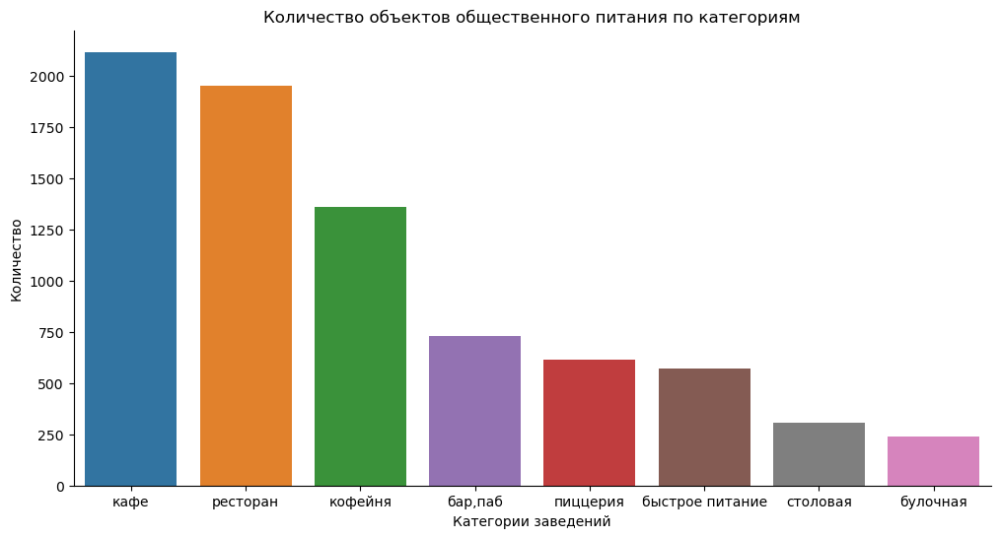

In [57]:
#визуализировали количество заведений по категориям
plt.figure(figsize=(12, 6))

ax = sns.barplot(
#             category,
            data=category,
            x='category', 
            y='name',
            palette=category_colors
           )
sns.despine()
# ax.bar_label(ax.containers[0])

plt.title('Количество объектов общественного питания по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Количество')
plt.grid(False)
plt.xticks(rotation=0)
plt.show();

В тройке лидеров заведения в категориях: кафе на первом месте - 2116 заведений, рестораны на втором месте - 1953 заведения, замыкают кофейни - 1358 заведений. Меньше всего заведений в категории булочные - всего 238 заведений.

<a id='2.2-bullet'></a>
### Посадочные места 

Исследуем количество посадочных мест в заведения по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализацию.

In [58]:
# при заполнении пропусков считали минимальное, максимальное, среднее и медианное значения в количестве посадочных мест
seats.sort_values('seats_median', ascending=False, inplace=True)
seats

,category,seats_min,seats_max,seats_mean,seats_median
6,ресторан,0.0,1288.0,122.0,86.0
0,"бар,паб",0.0,1288.0,124.0,82.0
4,кофейня,0.0,1288.0,111.0,80.0
7,столовая,0.0,1200.0,100.0,76.0
2,быстрое питание,0.0,1040.0,99.0,65.0
3,кафе,0.0,1288.0,97.0,60.0
5,пиццерия,0.0,1288.0,94.0,55.0
1,булочная,0.0,625.0,89.0,50.0


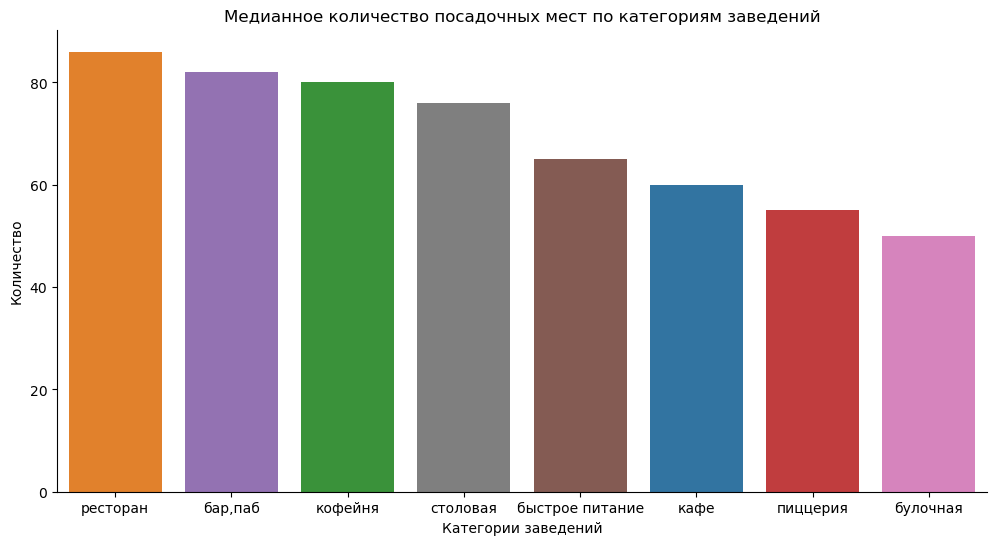

In [59]:
#визуализируем медианное значения количества посадочных мест по категориям заведений
plt.figure(figsize=(12, 6))

ax = sns.barplot(
#                 seats,
                data=seats,
                 x='category', 
                 y='seats_median',
                 palette=category_colors
                )
sns.despine()
# ax.bar_label(ax.containers[0])

plt.title('Медианное количество посадочных мест по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Количество')
plt.grid(False)
plt.xticks(rotation=0)
plt.show();

По медианному количеству посадочных мест тройка лидеров выглядит следующим образом: ресторан на первом месте - 86 посадочных мест, далее идут бары, пабы - 82 места и  замыкают кофейни с 80 посадочными местами. В булочных меньше всего посадочных мест - 50.

<a id='2.3-bullet'></a>
### Cоотношение сетевых и несетевых заведений

Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Исследуем каких заведений больше, какие категории заведений чаще являются сетевыми.

In [60]:
#заменим в столбце 'chain' значения 0 и 1 на "несетевые" и "сетевые" соответственно
places['chain'] = places['chain'].replace(0, 'несетевые')
places['chain'] = places['chain'].replace(1, 'сетевые')

In [61]:
# сгруппируем по столбцу количество заведений
chain = (places
         .groupby('chain', as_index = False)
         .agg({'name': 'count'})
        )
chain

,chain,name
0,несетевые,4838
1,сетевые,3048


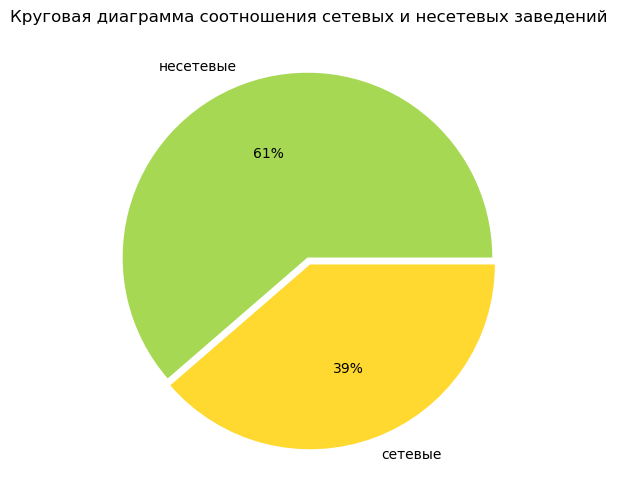

In [62]:
#изобразили на круговой диаграмме соотношение сетевых и несетевых заведений
plt.figure(figsize=(12, 6))

plt.pie(chain['name'], 
        labels=chain['chain'], 
        autopct='%1.0f%%',
        colors=['#a6d854', '#ffd92f'],
        explode=[0.02, 0.02]
       )

plt.title('Круговая диаграмма соотношения сетевых и несетевых заведений')
plt.show();

In [63]:
#сгруппируем сетевые и несетевые по категориям заведений и посчитаем % сетевых заведений по категориям
category_chain = (places
                  .pivot_table(index='category', 
                               columns='chain', 
                               values='name',
                              aggfunc='count')
                  .reset_index()
)
category_chain.columns = ['category', 'non_chain', 'chain']
category_chain['count'] = category_chain['non_chain'] + category_chain['chain']
category_chain['chain_percent'] = np.round(category_chain['chain'] / category_chain['count'], 2)*100
category_chain.sort_values('chain_percent', ascending=False, inplace=True)
category_chain

,category,non_chain,chain,count,chain_percent
1,булочная,89,149,238,63.0
5,пиццерия,294,320,614,52.0
4,кофейня,665,693,1358,51.0
2,быстрое питание,350,222,572,39.0
6,ресторан,1255,698,1953,36.0
3,кафе,1395,721,2116,34.0
7,столовая,219,85,304,28.0
0,"бар,паб",571,160,731,22.0


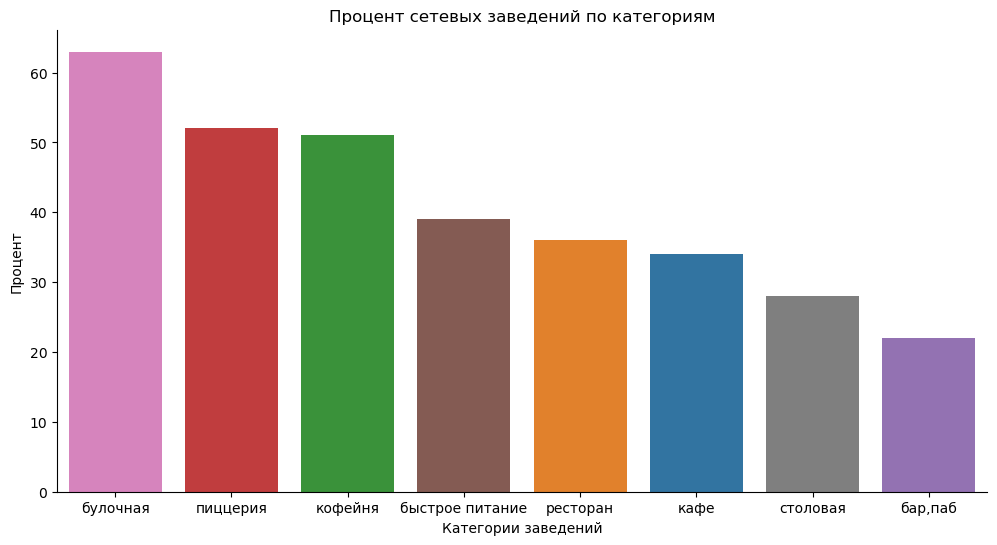

In [64]:
# изобразим процент сетевых заведений от общего количества по категориям
plt.figure(figsize=(12, 6))

ax = sns.barplot(
#             category_chain,
            data=category_chain,
            x='category', 
            y='chain_percent',
            palette=category_colors
           )
sns.despine()
# ax.bar_label(ax.containers[0])

plt.title('Процент сетевых заведений по категориям')
plt.xlabel('Категории заведений')
plt.ylabel('Процент')
plt.grid(False)
plt.xticks(rotation=0)
plt.show();

Как видно из графиков несетевых заведений больше - их 61% против 39% сетевых. Чаще сетевыми завелениями становяться булочные - 63% от общего количества в категории, пиццерии - 52% сетевых и кофейни - 51% сетевых. Меньше всего сетевых заведений в категории бар, паб - там всего сетевых заведений 22%.

<a id='2.4-bullet'></a>
### Tоп-15 популярных сетей в Москве

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве. 

Под популярностью будем понимать количество заведений этой сети в регионе.

In [65]:
# изменил категории некоторых сетей, т.к. были ошибки 
places.loc[places['name'] == 'prime', 'category'] = 'кафе'
places.loc[places['name'] == 'теремок', 'category'] = 'быстрое питание'

In [66]:
#сгруппировали данные по названиям заведений и нашли топ-15 популярных сетей
places_name = (places
               .groupby(['name', 'category', 'chain'], as_index=False)
               .agg({'address': 'count'})
              )
places_name.columns = ['name', 'category', 'chain', 'count']
places_name = places_name[places_name['chain'] == 'сетевые']
places_name = places_name.sort_values('count', ascending=False).head(15)
places_name

,name,category,chain,count
5582,шоколадница,кофейня,сетевые,115
2599,домино'с пицца,пиццерия,сетевые,75
2566,додо пицца,пиццерия,сетевые,72
1157,one price coffee,кофейня,сетевые,68
5655,яндекс лавка,ресторан,сетевые,64
411,cofix,кофейня,сетевые,63
1294,prime,кафе,сетевые,48
3260,кофепорт,кофейня,сетевые,42
3321,кулинарная лавка братьев караваевых,кафе,сетевые,38
4819,теремок,быстрое питание,сетевые,36


In [67]:
#подсчитали % категории от всего количества заведений, которые попало в ТОП-15
category_name = (places_name
                 .groupby('category', as_index=False)
                 .agg({'count': 'sum'})
                 .sort_values('count', ascending=False)
                )
category_name['share_category'] = np.round((category_name['count'] / category_name['count'].sum() * 100), 2)
category_name

,category,count,share_category
3,кофейня,339,45.63
4,пиццерия,147,19.78
2,кафе,132,17.77
5,ресторан,64,8.61
1,быстрое питание,36,4.85
0,булочная,25,3.36


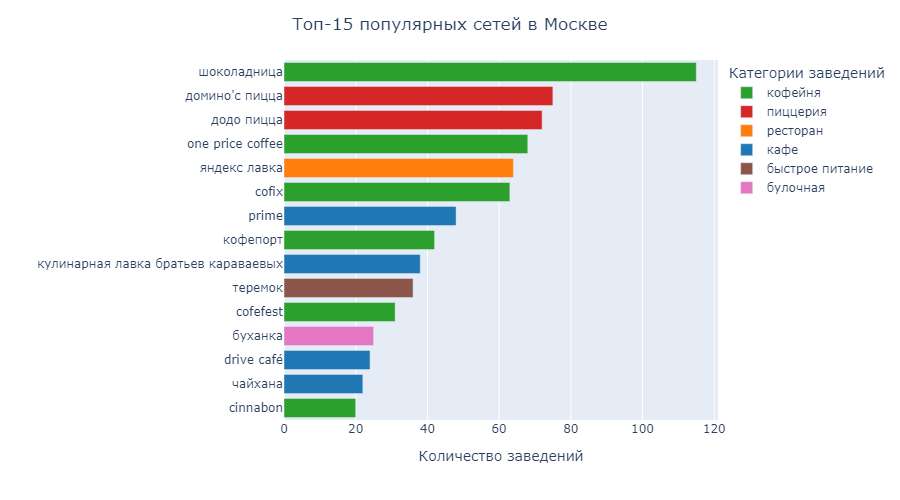

In [68]:
# визуализировали рапределение топ-15 популярных сетей в Москве по количеству заведений
fig = px.bar(places_name, 
             x='count', 
             y='name', 
             color='category',
             width=900, 
             height=500,
             color_discrete_map=category_colors,
             #text_auto =True
             )
fig.update_layout(yaxis = {'categoryorder':'total ascending'},
                  title_text='Tоп-15 популярных сетей в Москве', title_x=0.5,
                  xaxis_title='Количество заведений',
                  yaxis_title='',
                  legend_title='Категории заведений'
                 )
fig.show('png')

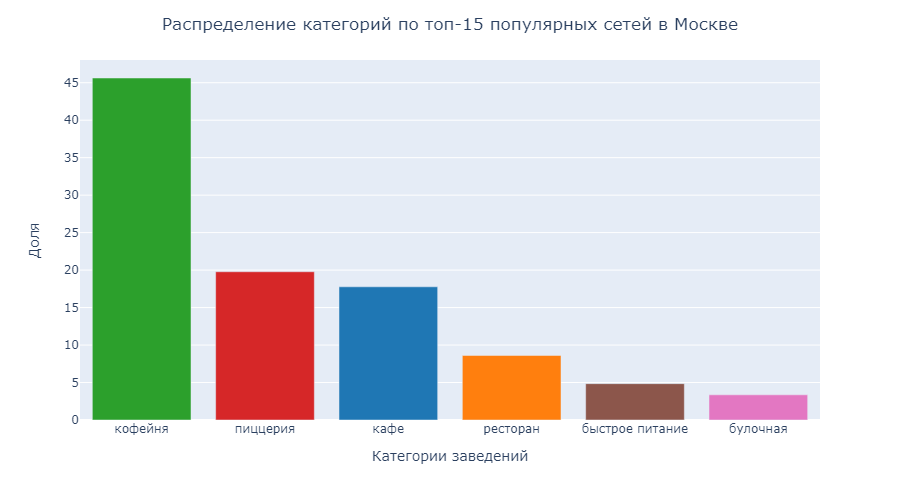

In [69]:
# визуализировали распределение категорий по топ-15 популярных сетей в Москве
fig = px.bar(category_name, 
             x='category', 
             y='share_category', 
             color='category',
             width=900, 
             height=500,
             color_discrete_map=category_colors,
             #text_auto =True
             )
fig.update_layout(title_text='Распределение категорий по топ-15 популярных сетей в Москве', title_x=0.5,
                  xaxis_title='Категории заведений',
                  yaxis_title='Доля',
                  #legend_title='Категории заведений',
                  showlegend=False
                 )
fig.show('png')

В топ-15 популярных сетей в Москве преобладают заведения в категориях: кофейня и пиццерия. Это знакомые нам сети: 	кофейня Шоколадница и пицеррии Домино'с пицца и Додо пицца.

<a id='2.5-bullet'></a>
### Административные районы Москвы

Определим какие административные районы Москвы присутствуют в датасете. Отобразим общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем эту информацию одним графиком.

In [70]:
# определили какие административные районы Москвы присутсвуют в датасете
places['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [71]:
#скопировали столбец с районами Москвы
places['district1'] = places['district'].copy()
#задали сокращенные названия для районов с целью локаничного отображения на графиках
places['district1'] = places['district1'].replace(
{
    'Северный административный округ': 'САО',
    'Северо-Восточный административный округ': 'СВАО',
    'Северо-Западный административный округ': 'СЗАО',
    'Западный административный округ': 'ЗАО',
    'Центральный административный округ': 'ЦАО',
    'Восточный административный округ': 'ВАО',
    'Юго-Восточный административный округ': 'ЮВАО',
    'Южный административный округ': 'ЮАО',
    'Юго-Западный административный округ': 'ЮЗАО'
}
)
places[['district', 'district1']]

,district,district1
0,Северный административный округ,САО
1,Северный административный округ,САО
2,Северный административный округ,САО
3,Северный административный округ,САО
4,Северный административный округ,САО
...,...,...
8401,Юго-Западный административный округ,ЮЗАО
8402,Южный административный округ,ЮАО
8403,Юго-Восточный административный округ,ЮВАО
8404,Юго-Восточный административный округ,ЮВАО


In [72]:
#вывели цветовую палитку для задания цвета по районам
print(sns.color_palette('husl', 9).as_hex())

['#f77189', '#d58c32', '#a4a031', '#50b131', '#34ae91', '#37abb5', '#3ba3ec', '#bb83f4', '#f564d4']


In [73]:
#задали каждому району свой цвет
category_colors1 = {
    'САО': '#f77189',
    'СВАО': '#d58c32',
    'СЗАО': '#a4a031',
    'ЗАО': '#50b131',
    'ЦАО': '#34ae91',
    'ВАО': '#37abb5',
    'ЮВАО': '#3ba3ec',
    'ЮАО': '#bb83f4',
    'ЮЗАО': '#f564d4'
}
category_colors1

{'САО': '#f77189',
 'СВАО': '#d58c32',
 'СЗАО': '#a4a031',
 'ЗАО': '#50b131',
 'ЦАО': '#34ae91',
 'ВАО': '#37abb5',
 'ЮВАО': '#3ba3ec',
 'ЮАО': '#bb83f4',
 'ЮЗАО': '#f564d4'}

In [74]:
# сгруппируем количество заведений по районам
district_count = (places
                   .groupby('district1', as_index=False)
                   .agg({'name': 'count'})
                   .sort_values('name', ascending=False)
                  )
district_count

,district1,name
5,ЦАО,2172
3,СВАО,846
2,САО,841
6,ЮАО,818
1,ЗАО,799
0,ВАО,731
8,ЮЗАО,670
7,ЮВАО,636
4,СЗАО,373


In [75]:
# отобразили общее количество заведений и количество заведений каждой категории по районам
district = (places
            .groupby(['district1', 'category'], as_index=False)
            .agg({'name': 'count'})
            .sort_values(['category','name'])
           )
district

,district1,category,name
32,СЗАО,"бар,паб",22
56,ЮВАО,"бар,паб",36
64,ЮЗАО,"бар,паб",38
8,ЗАО,"бар,паб",46
0,ВАО,"бар,паб",47
...,...,...,...
23,САО,столовая,38
7,ВАО,столовая,40
31,СВАО,столовая,40
55,ЮАО,столовая,42


In [76]:
district1 = district.merge(district_count, left_on='district1', right_on='district1', how='left')
district1.columns = ['district1', 'category', 'count', 'total']
district1['category_share'] = np.round((district1['count'] / district1['total'])*100,2)
district1

,district1,category,count,total,category_share
0,СЗАО,"бар,паб",22,373,5.90
1,ЮВАО,"бар,паб",36,636,5.66
2,ЮЗАО,"бар,паб",38,670,5.67
3,ЗАО,"бар,паб",46,799,5.76
4,ВАО,"бар,паб",47,731,6.43
...,...,...,...,...,...
67,САО,столовая,38,841,4.52
68,ВАО,столовая,40,731,5.47
69,СВАО,столовая,40,846,4.73
70,ЮАО,столовая,42,818,5.13


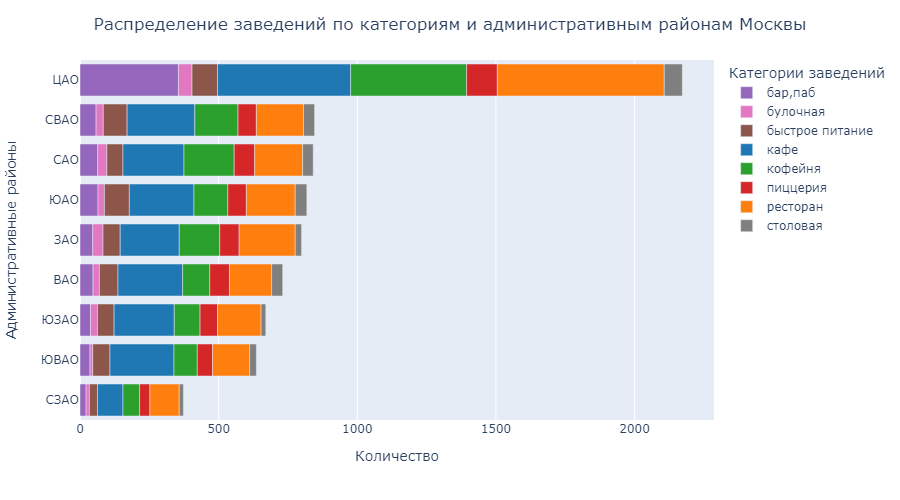

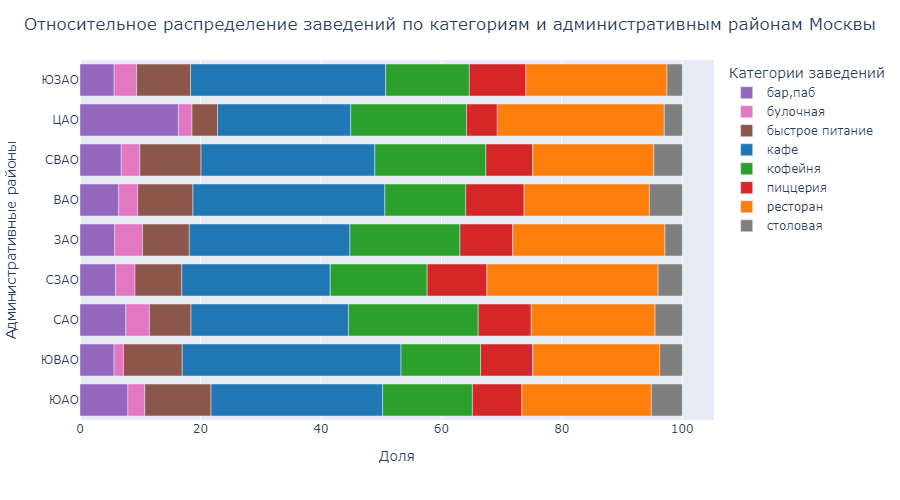

In [77]:
# визуализировали распределение заведений по категориям в рамках административных районов Москвы

fig = px.bar(district1, 
             x='count', 
             y='district1', 
             color='category',
             width=900, 
             height=500,
             color_discrete_map=category_colors,
             #text_auto =True
             )
fig.update_layout(title_text='Распределение заведений по категориям и административным районам Москвы', title_x=0.5,
                  xaxis_title='Количество',
                  yaxis_title='Административные районы',
                  legend_title='Категории заведений',
                  yaxis = {'categoryorder':'total ascending'},
                  
                 )
fig.show('png')

# визуализировали относительное распределение заведений по категориям в рамках административных районов Москвы
fig = px.bar(district1, 
             x='category_share', 
             y='district1', 
             color='category',
             width=900, 
             height=500,
             color_discrete_map=category_colors,
             #text_auto =True
             )
fig.update_layout(title_text='Относительное распределение заведений по категориям и административным районам Москвы', 
                  title_x=0.5,
                  xaxis_title='Доля',
                  yaxis_title='Административные районы',
                  legend_title='Категории заведений',
                  yaxis = {'categoryorder':'total ascending'},
                  
                 )
fig.show('png')

По числу заведений лидирует Центральный административный округ, отрыв более чем в 2 раза от остальных районов. В относительном выражении там больше всего ресторанов и баров, пабов.

<a id='2.6-bullet'></a>
### Распределение средних рейтингов по категориям заведений

Визуализируем распределение средних рейтингов по категориям заведений. Определим сильно ли различаются усреднённые рейтинги в разных типах общепита.

In [78]:
#сгруппировали заведения по категориям отобразив средний рейтинг в каждой группе
rating = (places
          .groupby('category', as_index=False)
          .agg({'rating': 'mean'})
          .sort_values('rating', ascending=False)
         )
rating['rating'] = np.round(rating['rating'], 2)
rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.30
1,булочная,4.29
4,кофейня,4.28
7,столовая,4.21
3,кафе,4.14
2,быстрое питание,4.07


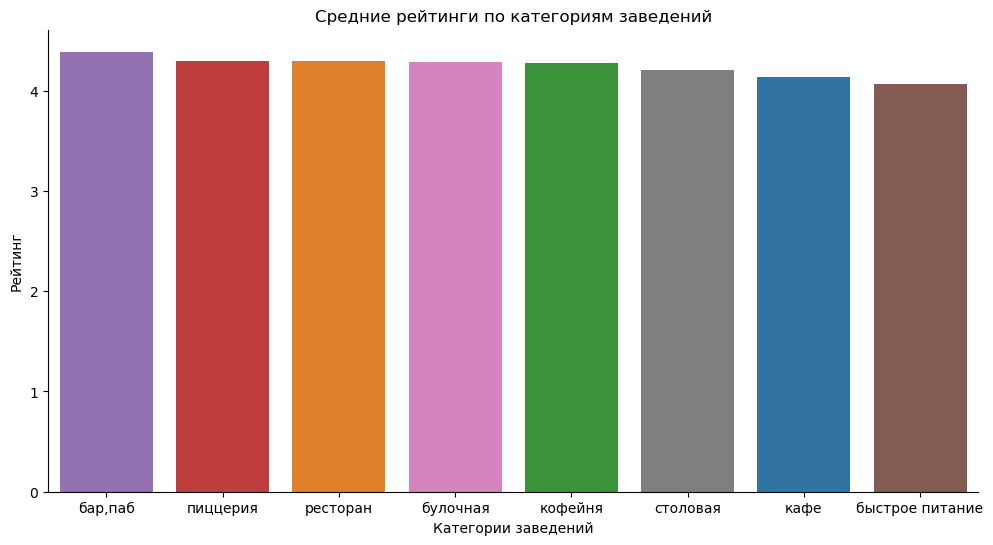

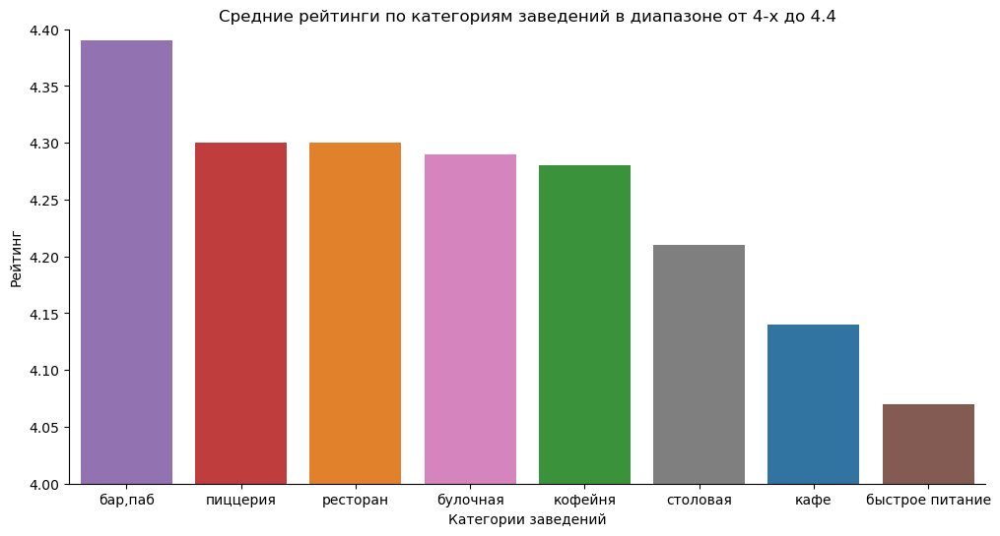

In [79]:
#визуализировали усредненные оценки по категориям
plt.figure(figsize=(12, 6))

ax = sns.barplot(
#             rating,
            data=rating,
            x='category', 
            y='rating',
            palette=category_colors
           )
sns.despine()

# ax.bar_label(ax.containers[0])

plt.title('Средние рейтинги по категориям заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг')
plt.grid(False)
plt.xticks(rotation=0)

#визуализировали усредненные оценки по категориям задав масштаб оси оси у от 4-х до 4.4
plt.figure(figsize=(12, 6))

ax = sns.barplot(
#             rating,
            data=rating,
            x='category', 
            y='rating',
            palette=category_colors
           )
sns.despine()
ax.axis(ymin=4, ymax=4.4)
# ax.bar_label(ax.containers[0])

plt.title('Средние рейтинги по категориям заведений в диапазоне от 4-х до 4.4')
plt.xlabel('Категории заведений')
plt.ylabel('Рейтинг')
plt.grid(False)
plt.xticks(rotation=0)
plt.show();

Усредненные рейтинги не сильно различаются в разных типах общепита. На первом месте с усредненной оценкой категория заведений бар, паб - 4.39, на последнем месте быстрое питание - 4.07.

<a id='2.7-bullet'></a>
###  Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [80]:
# сгруппируем данные со средним рейтингом заведений каждого района
rating_district = (places
                   .groupby('district', as_index=False)
                   .agg({'rating': 'mean'})
                   .sort_values('rating', ascending=False)
                  )
rating_district['rating'] = np.round(rating_district['rating'], 2)
rating_district

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.25
4,Северо-Западный административный округ,4.24
0,Восточный административный округ,4.19
8,Южный административный округ,4.19
1,Западный административный округ,4.18
7,Юго-Западный административный округ,4.18
3,Северо-Восточный административный округ,4.16
6,Юго-Восточный административный округ,4.12


In [81]:
# подключаем модуль для работы с JSON-форматом
import json
# читаем файл и сохраняем в переменной
try:
    with open('admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)
except:
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Высокий рейтинг заведений в центральном районе - 4.38, низкий в Северо-Восточным административным округе - 4.16 и Юго-Восточном административном округе - 4.12

<a id='2.8-bullet'></a>
### Все заведения датасета на карте

Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [82]:
# импортируем карту и маркер
#from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
#moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
places.apply(create_clusters, axis=1)

# выводим карту
m1

Больше всего заведений в Центральном административном округе

<a id='2.9-bullet'></a>
### Топ-15 улиц по количеству заведений

Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам. Проиллюстрируем эту информацию одним графиком.

In [83]:
# нашли топ-15 улиц с количеством заведений
street = (
    places.groupby('street', as_index=False)
    .agg({'name': 'count'})
    .sort_values('name', ascending=False).head(15)
)
street

,street,name
818,проспект мира,177
822,профсоюзная улица,115
518,ленинский проспект,100
815,проспект вернадского,96
365,дмитровское шоссе,87
447,каширское шоссе,75
295,варшавское шоссе,72
516,ленинградский проспект,70
517,ленинградское шоссе,69
539,люблинская улица,60


In [84]:
# нашли категории заведений по топ-15 улиц
street_top_15 = street['street']
category_street = (places
                   .query('street in @street_top_15')
                   .groupby(['street', 'category'], as_index=False)
                   .agg({'name': 'count'})
                   .sort_values(['category', 'name'])
                  )
category_street

,street,category,name
15,каширское шоссе,"бар,паб",2
22,кутузовский проспект,"бар,паб",2
97,улица вавилова,"бар,паб",2
104,улица миклухо-маклая,"бар,паб",3
7,дмитровское шоссе,"бар,паб",5
...,...,...,...
89,профсоюзная улица,столовая,3
14,дмитровское шоссе,столовая,4
21,каширское шоссе,столовая,5
53,ленинский проспект,столовая,5


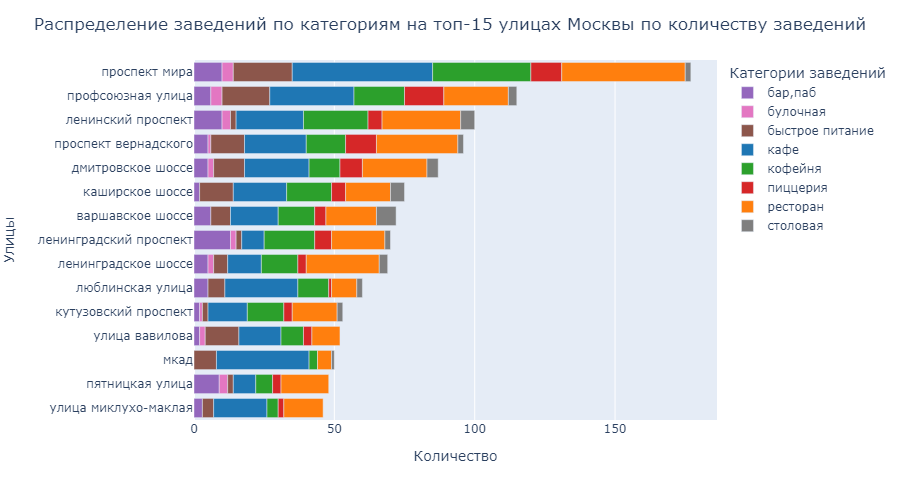

In [85]:
# проилюстрировали распределение заведений по категориям на топ-15 улицах
fig = px.bar(
    category_street,
    x='name',
    y='street',
    color='category',
    color_discrete_map=category_colors,
    width=900, 
    height=500,
    #text_auto =True
)
fig.update_layout(title_text='Распределение заведений по категориям на топ-15 улицах Москвы по количеству заведений', 
                  title_x=0.5,
                  xaxis_title='Количество',
                  yaxis_title='Улицы',
                  legend_title='Категории заведений',
                  yaxis = {'categoryorder':'total ascending'},
                  
                 )
fig.show('png')

Больше всего заведений на проспекте Мира. Преимущственно это кафе, кофейни или рестораны. 

Проспект Мира - одна из самых известных и длинных улиц в городе Москва. Этот проспект начинается от Каланчевской площади и тянется на север вплоть до Останкинского района, превращаясь в Останкинскую улицу. Общая длина проспекта составляет около 9 километров. 

Остальные улицы также достаточно длинные:

 - общая протяженность Профсоюзной улицы составляет 9 километров 300 метров
 - Ленинский проспект - самая длинная улица, названная в честь вождя мирового пролетариата, находится в столице России, протяженность 16 километров


<a id='2.10-bullet'></a>
### Один объект общепита на улице

Найдем улицы, на которых находится только один объект общепита.

In [86]:
# сгруппировали количество заведений по улица, отфильтровали улицы, где один объект общепита
street_1_name = (places
                 .groupby(['street'], as_index=False)
                 .agg({'name': 'count'})
                 .sort_values('name')
                 .query('name == 1')['street']
)
street_1_name

0            1-й автозаводский проезд
681              октябрьский переулок
685                    онежская улица
686                   ордынский тупик
687                оренбургская улица
                    ...              
189                барвихинская улица
6           1-й дербеневский переулок
19         1-й новокузнецкий переулок
229          большая пионерская улица
27     1-й спасоналивковский переулок
Name: street, Length: 459, dtype: object

Найдена 461 улица, где есть всего одно заведение. Посмотрим как распределены данные заведения по категориям и районам

In [87]:
# сгруппировали количество заведений по категориям и районам, отфильтровав по улицам с одним объектом общепита
category_1_name = (places
                   .query('street in @street_1_name')
                   .groupby(['category', 'district1'], as_index=False)
                   .agg({'name': 'count'})
                   .sort_values('name', ascending=False)
)
category_1_name

,category,district1,name
27,кафе,ЦАО,37
36,кофейня,ЦАО,34
52,ресторан,ЦАО,32
5,"бар,паб",ЦАО,23
22,кафе,ВАО,21
...,...,...,...
17,быстрое питание,СЗАО,1
20,быстрое питание,ЮВАО,1
42,пиццерия,САО,1
46,пиццерия,ЮВАО,1


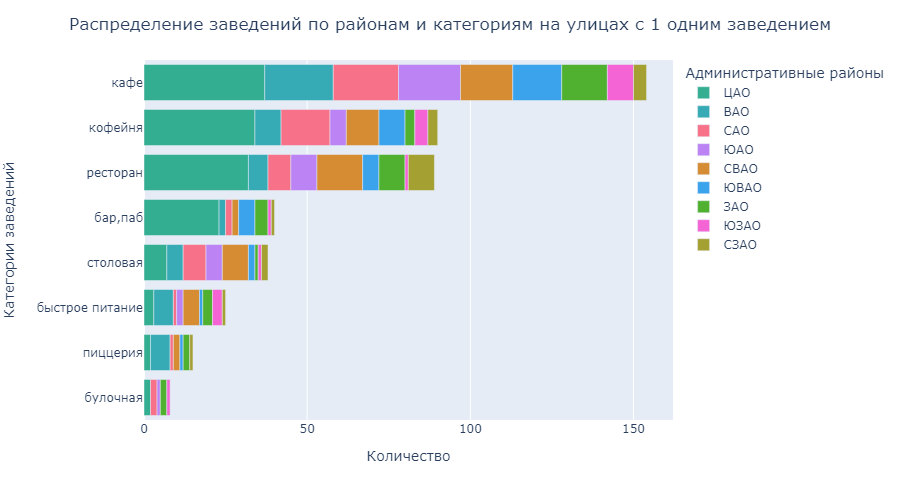

In [88]:
# визуализировали распределение заведений по районам и категориям на улицах с 1 одним заведением
fig = px.bar(
    category_1_name,
    x='name',
    y='category',
    color='district1',
    width=900, 
    height=500,
    color_discrete_map=category_colors1
)
fig.update_layout(title_text='Распределение заведений по районам и категориям на улицах с 1 одним заведением', 
                  title_x=0.5,
                  yaxis_title='Категории заведений',
                  xaxis_title='Количество',
                  legend_title='Административные районы',
                  yaxis = {'categoryorder':'total ascending'}
                 )
fig.show('png')

Покажем карту, где располагаются улицы, на которых находится только один объект общепита. Посмотрим, где больше всего таких заведений - в центре или на окраине.

In [89]:
# импортируем карту и маркер
#from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
#moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster_1 = MarkerCluster().add_to(m_1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters_1(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster_1)

# применяем функцию create_clusters() к каждой строке датафрейма
places.query('street in @street_1_name').apply(create_clusters_1, axis=1)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=places.query('street in @street_1_name'),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_1)

# выводим карту
m_1

Большинство улиц с 1 заведением расположены в Центральном административном округе. По категориям лидируют кафе, за ним следуют кофейни и рестораны.

<a id='2.11-bullet'></a>
### Средний чек заведений по районам

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. Проверим как удалённость от центра влияет на цены в заведениях.

In [91]:
# сгруппировали медиану средних чеков по районам
middle_avg_bill = (places
                   .query('middle_avg_bill != -1')
                   .groupby('district', as_index=False)
                   .agg({'middle_avg_bill': 'median'})
                   .sort_values('middle_avg_bill', ascending=False)
)
middle_avg_bill

,district,middle_avg_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,975.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,444.5


In [92]:
# сгруппировали медиану средних чеков по категориям
middle_avg_bill_category = (places
                   .query('middle_avg_bill != -1')
                   .groupby('category', as_index=False)
                   .agg({'middle_avg_bill': 'median'})
                   .sort_values('middle_avg_bill', ascending=False)
)
middle_avg_bill_category

,category,middle_avg_bill
0,"бар,паб",1250.0
6,ресторан,1250.0
5,пиццерия,600.0
3,кафе,500.0
1,булочная,450.0
4,кофейня,400.0
2,быстрое питание,375.0
7,столовая,300.0


In [93]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')
Choropleth(
    geo_data=geo_json,
    data=middle_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

# выводим карту
m2

Высокий средний чек можем наблюдать в Центральном административном округе и Западном административном округе.
Также интересно, что в западной части Москвы средний чек выше чем в восточной части. На юго-востоке самый низкий чек.  Удаленность от центра Москвы влияет на средний чек не во всех районах. На величину среднего чека влияет доля ресторанов и пабов в административных округах, в данных категориях средний чек выше. В ЦАО и ЗАО больше всего ресторанов в количественном выражении, чем в других округах.

В данном разделе проанализировали заведения общественного питания Москвы. Большинство заведений находятся в Центральном административном округе - 2179 заведений, данный район лидируют по рейтингам пользователей - 4.38 и там один из самых высоких средних чеков - 1000 рублей. Здесь же распологается большинство улиц с одним объектом общепита и как правило это лидеры категорий по количеству заведений. В тройке лидеров заведения в категориях: кафе на первом месте - 2116 заведений, рестораны на втором месте - 1961 заведения, замыкают кофейни - 1360 заведений. Несетевых заведений больше, чем сетевых 61% против 39%. Из сетевых заведений знакомые нам сети: кофейня Шоколадница и пицеррии Домино'с пицца и Додо пицца. Больше всего заведений на Проспекте Мира, в основном это лидеры категорий: кафе, рестораны и кофейни.

## Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

<a id='3.1-bullet'></a>
### Количество кофеен в датасете

Определим сколько всего кофеен в датасете. В каких районах их больше всего, каковы особенности их расположения.

In [94]:
# отфильтровали датасет по категории "кофейня" и посчитали количество
coffee_shops = places[places['category'] == 'кофейня']
coffee_shops

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street1,is_24_7,district1
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,-1,Цена чашки капучино:155–185 ₽,-1.0,170.0,несетевые,80,улица маршала федоренко,улица маршала федоренко,False,САО
25,в парке вкуснее,кофейня,"москва, парк левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,-1,-1,-1.0,-1.0,сетевые,80,парк левобережный,NaN,False,САО
45,9 bar coffee,кофейня,"москва, коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,-1,-1,-1.0,-1.0,сетевые,46,коровинское шоссе,коровинское шоссе,False,САО
46,cofefest,кофейня,"москва, улица маршала федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,-1,-1,-1.0,-1.0,сетевые,80,улица маршала федоренко,улица маршала федоренко,False,САО
52,cofix,кофейня,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,-1,-1,-1.0,-1.0,сетевые,80,улица дыбенко,улица дыбенко,False,САО
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8356,назис пури,кофейня,"москва, люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,-1,-1,-1.0,-1.0,несетевые,80,люблинская улица,люблинская улица,False,ЮВАО
8365,квадрат кофе,кофейня,"москва, волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,-1,Цена чашки капучино:100–220 ₽,-1.0,160.0,несетевые,206,волгоградский проспект,волгоградский проспект,False,ЮВАО
8376,шоколад имбирь корица,кофейня,"москва, грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,-1,-1,-1.0,-1.0,несетевые,80,грайвороновская улица,грайвороновская улица,False,ЮВАО
8385,cafio,кофейня,"москва, новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,-1,Цена чашки капучино:80–120 ₽,-1.0,100.0,несетевые,80,новохохловская улица,новохохловская улица,False,ЮВАО


In [95]:
#вывели информацию по сформированному датасу
coffee_shops.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1358 entries, 3 to 8400
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1358 non-null   object 
 1   category           1358 non-null   object 
 2   address            1358 non-null   object 
 3   district           1358 non-null   object 
 4   hours              1358 non-null   object 
 5   lat                1358 non-null   float64
 6   lng                1358 non-null   float64
 7   rating             1358 non-null   float64
 8   price              1358 non-null   object 
 9   avg_bill           1358 non-null   object 
 10  middle_avg_bill    1358 non-null   float64
 11  middle_coffee_cup  1358 non-null   float64
 12  chain              1358 non-null   object 
 13  seats              1358 non-null   int32  
 14  street             1358 non-null   object 
 15  street1            1330 non-null   object 
 16  is_24_7            1358 non-n

В датасете 1358 кофеен, пропусков и потери данных после фильтрации нет.

In [96]:
print( 'Количество кофеен от общего числа заведений - {:.1%}'
      .format(coffee_shops['category'].count() / places['category'].count())
)

Количество кофеен от общего числа заведений - 17.2%


In [97]:
# сгруппировали количество кофеен по административным районам
coffee_shops_district = (coffee_shops
                         .groupby('district1', as_index=False)
                         .agg({'name': 'count'})
                         .sort_values('name', ascending=False)
)
coffee_shops_district

,district1,name
5,ЦАО,418
2,САО,181
3,СВАО,156
1,ЗАО,146
6,ЮАО,122
0,ВАО,98
8,ЮЗАО,93
7,ЮВАО,84
4,СЗАО,60


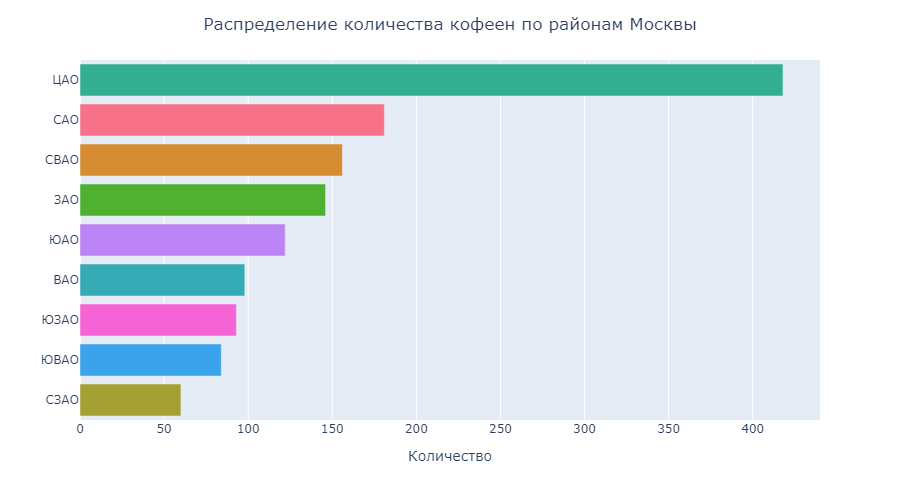

In [98]:
#визуализировали распределение кофеен по районам
fig = px.bar(
    coffee_shops_district,
    x='name',
    y='district1',
    color='district1',
    width=900, 
    height=500,
#     text_auto =True,
    color_discrete_map=category_colors1
)
fig.update_layout(title_text='Распределение количества кофеен по районам Москвы', 
                  title_x=0.5,
                  xaxis_title='Количество',
                  yaxis_title='',
                  showlegend=False,
                  legend_title=''
                 )
fig.show('png')

In [99]:
# создаём карту Москвы
m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster1 = MarkerCluster().add_to(m3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters1(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster1)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_shops.apply(create_clusters1, axis=1)

# выводим карту
m3

Больше всего кофеен сосредоточено в Центральном административном округе, где расположена бизнес активность Москвы и туристический поток. Много кофеен на проходимых и центральных улицах. 

<a id='3.2-bullet'></a>
### Круглосуточные кофейни

Определим есть ли круглосуточные кофейни.

In [100]:
# посчитали круглосуточные кофейни
coffee_shops[coffee_shops['is_24_7'] == True]['name'].count()

56

In [101]:
#заменим в столбце 'chain' значения 0 и 1 на "несетевые" и "сетевые" соответственно
coffee_shops['is_24_7'] = coffee_shops['is_24_7'].replace(True, 'круглосуточные')
coffee_shops['is_24_7'] = coffee_shops['is_24_7'].replace(False, 'некруглосуточные')

In [102]:
# сгруппировали по признаку работы
is_24_7 = (coffee_shops
           .groupby('is_24_7', as_index=False)
           .agg({'name':'count'})
)
is_24_7

,is_24_7,name
0,круглосуточные,56
1,некруглосуточные,1302


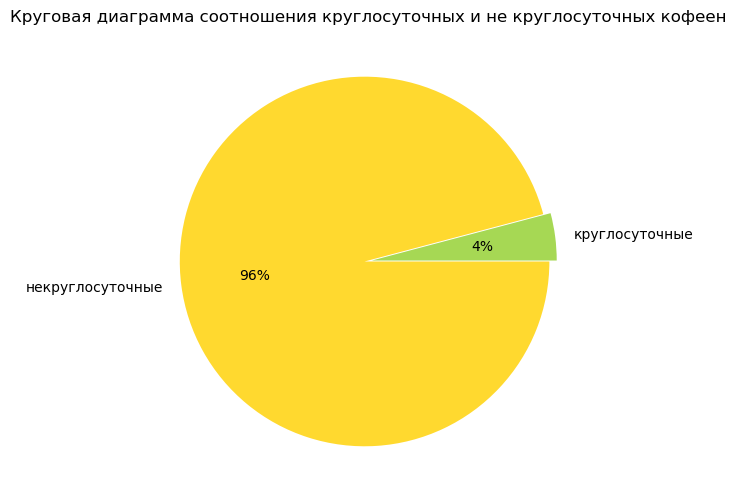

In [103]:
#изобразили на круговой диаграмме соотношение кофеен круглосуточных и не круглосуточных
plt.figure(figsize=(12, 6))

plt.pie(is_24_7['name'], 
        labels=is_24_7['is_24_7'], 
        autopct='%1.0f%%',
        colors=['#a6d854', '#ffd92f'],
        explode=[0.02, 0.02]
       )

plt.title('Круговая диаграмма соотношения круглосуточных и не круглосуточных кофеен')
plt.show();

Из всех кофеен - только 4% являются круглосуточными.

<a id='3.3-bullet'></a>
### Рейтинги кофеен

Определим какие у кофеен рейтинги. Как они распределяются по районам.

In [104]:
# сгруппировали средние рейтинги кофеен по районам Москвы
coffee_shops_rating = (coffee_shops
                       .groupby('district', as_index=False)
                       .agg({'rating': 'mean'})
                       .sort_values('rating', ascending=False)
    
)
coffee_shops_rating['rating'] = np.round(coffee_shops_rating['rating'], 2)
coffee_shops_rating

,district,rating
5,Центральный административный округ,4.33
4,Северо-Западный административный округ,4.31
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.24
3,Северо-Восточный административный округ,4.22
6,Юго-Восточный административный округ,4.22
1,Западный административный округ,4.19


In [105]:
#вывели топ-15 улиц с самой высоким рейтингом
coffee_rating_street = (coffee_shops
                       .groupby('street', as_index=False)
                       .agg({'rating': 'mean'})
                       .sort_values('rating', ascending=False)
                       .head(15)
    
)
coffee_rating_street['rating'] = np.round(coffee_rating_street['rating'], 2)
coffee_rating_street

,street,rating
276,никулинская улица,5.00
224,лубянский проезд,5.00
378,светлогорский проезд,5.00
160,западный административный округ,5.00
35,3-й силикатный проезд,5.00
441,улица академика арцимовича,5.00
38,3-я радиаторская улица,5.00
414,суздальская улица,5.00
559,улица сретенка,4.95
591,хоромный тупик,4.90


In [106]:
#список топ-15 улиц с высоким рейтингом заведений
coffee_rating = coffee_rating_street['street']
coffee_shops.query('street in @coffee_rating') # вывели кофейни с топ-15 улиц с высоким рейтингом заведений

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street1,is_24_7,district1
60,чебуречная история,кофейня,"москва, ландшафтный заказник лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,-1,-1,-1.0,-1.0,сетевые,80,ландшафтный заказник лианозовский,NaN,некруглосуточные,СВАО
324,иду лесом,кофейня,"москва, светлогорский проезд, 13, стр. 7",Северо-Западный административный округ,"ежедневно, 09:00–22:00",55.848242,37.402168,5.0,средние,Цена чашки капучино:150–180 ₽,-1.0,165.0,несетевые,80,светлогорский проезд,светлогорский проезд,некруглосуточные,СЗАО
1283,pique-nique,кофейня,"москва, 3-я радиаторская улица, 9",Северный административный округ,"ежедневно, 09:00–22:00",55.818584,37.490628,5.0,низкие,Цена чашки капучино:170–220 ₽,-1.0,195.0,несетевые,80,3-я радиаторская улица,3-я радиаторская улица,некруглосуточные,САО
2609,про людей,кофейня,"москва, амурская улица, 1а, корп. 1",Восточный административный округ,"пн-пт 08:00–22:00; сб,вс 09:00–22:00",55.808030,37.757611,4.9,-1,-1,-1.0,-1.0,несетевые,92,амурская улица,амурская улица,некруглосуточные,ВАО
3152,illy,кофейня,"москва, 3-й силикатный проезд, 3",Северо-Западный административный округ,пн-пт 08:00–20:00; сб 10:00–18:00,55.769339,37.498209,5.0,-1,Цена чашки капучино:120–150 ₽,-1.0,135.0,несетевые,80,3-й силикатный проезд,3-й силикатный проезд,некруглосуточные,СЗАО
4408,bodrero,кофейня,"москва, улица сретенка, 9",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.767602,37.631515,5.0,-1,-1,-1.0,-1.0,сетевые,28,улица сретенка,улица сретенка,некруглосуточные,ЦАО
4411,за думой,кофейня,"москва, лубянский проезд, 5, стр. 1",Центральный административный округ,"пн-пт 10:00–22:00; сб,вс 12:00–22:00",55.758780,37.629375,5.0,средние,-1,-1.0,-1.0,несетевые,80,лубянский проезд,лубянский проезд,некруглосуточные,ЦАО
4445,one price coffee,кофейня,"москва, хоромный тупик, 2/6",Центральный административный округ,"ежедневно, 07:00–22:00",55.768192,37.648296,4.9,-1,-1,-1.0,-1.0,сетевые,80,хоромный тупик,хоромный тупик,некруглосуточные,ЦАО
4526,эклерная клер,кофейня,"москва, улица сретенка, 26/1",Центральный административный округ,"ежедневно, 09:00–21:00",55.770519,37.633358,4.9,-1,-1,-1.0,-1.0,несетевые,45,улица сретенка,улица сретенка,некруглосуточные,ЦАО
4737,церковный хлѣбъ,кофейня,"москва, никольская улица, 8/1с3",Центральный административный округ,"ежедневно, 10:00–22:00",55.757192,37.623324,4.9,-1,-1,-1.0,-1.0,несетевые,80,никольская улица,никольская улица,некруглосуточные,ЦАО


Визуализировали на карте кофейни которые входят в топ-15 улиц, у которых самый высокий рейтинг

In [107]:
# создаём карту Москвы
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=coffee_shops_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker4(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m4)
    
coffee_shops.query('street in @coffee_rating').apply(create_marker4, axis=1)   
# выводим карту
m4

Самые высокие рейтинги у кофеен в центральном районе - 4.33. Самые низкие рейтинги у кофеен в Западном административном округе - 4.19.В центральном районе также располагается больше всего улиц из топ-15 с самыми высокими оценками

<a id='3.4-bullet'></a>
### Cтоимость чашки капучино

Определим на какую стоимость чашки капучино стоит ориентироваться при открытии и почему.

In [108]:
#сгруппировали стоимость чашки капучино по районам Москвы
middle_coffee_cup = (coffee_shops
                     .query('middle_coffee_cup != -1')
                     .groupby(['district', 'district1'], as_index=False)
                     .agg({'middle_coffee_cup': 'median'})
                     .sort_values('middle_coffee_cup', ascending=False)
)
middle_coffee_cup

,district,district1,middle_coffee_cup
7,Юго-Западный административный округ,ЮЗАО,199.0
5,Центральный административный округ,ЦАО,192.5
1,Западный административный округ,ЗАО,187.0
3,Северо-Восточный административный округ,СВАО,162.5
2,Северный административный округ,САО,159.5
4,Северо-Западный административный округ,СЗАО,157.0
6,Юго-Восточный административный округ,ЮВАО,150.0
8,Южный административный округ,ЮАО,149.0
0,Восточный административный округ,ВАО,135.0


In [109]:
#вывели топ-15 улиц с самой высокой стоимостью чашки капучино
middle_coffee_cup_street = (coffee_shops
                     .query('middle_coffee_cup != -1')
                     .groupby('street', as_index=False)
                     .agg({'middle_coffee_cup': 'median'})
                     .sort_values('middle_coffee_cup', ascending=False)
                     .head(15)
)
middle_coffee_cup_street

,street,middle_coffee_cup
46,большая никитская улица,328.0
18,3-я фрунзенская улица,320.0
42,богословский переулок,300.0
50,большая сухаревская площадь,300.0
249,улица гарибальди,291.0
13,3-й крутицкий переулок,291.0
176,площадь победы,291.0
63,бутырская улица,290.5
133,милютинский переулок,290.0
89,енисейская улица,287.0


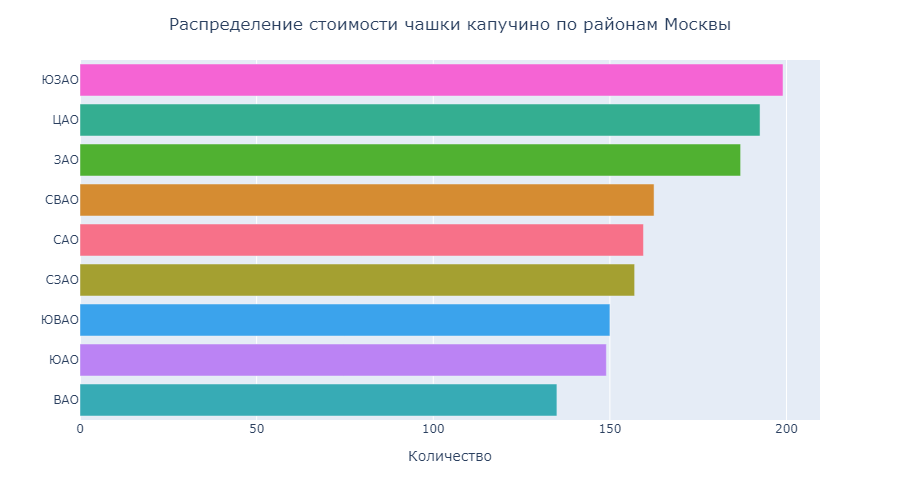

In [110]:
# визуализировали распределение чашки капучино по районам
fig = px.bar(
    middle_coffee_cup,
    x='middle_coffee_cup',
    y='district1',
    color='district1',
    width=900, 
    height=500,
#     text_auto =True,
    color_discrete_map=category_colors1
)
fig.update_layout(title_text='Распределение стоимости чашки капучино по районам Москвы', 
                  title_x=0.5,
                  xaxis_title='Количество',
                  yaxis_title='',
                  showlegend=False,
                  legend_title=''
                 )
fig.show('png')

In [111]:
#вывели кофейни которые входят в топ-15 улиц, у которых самый высокий чек
coffee_street = middle_coffee_cup_street['street']

coffee_shops.query('street in @coffee_street and middle_coffee_cup != -1')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,street1,is_24_7,district1
941,шоколадница,кофейня,"москва, енисейская улица, 11",Северо-Восточный административный округ,"ежедневно, 08:00–23:00",55.865204,37.661509,4.3,-1,Цена чашки капучино:285–289 ₽,-1.0,287.0,сетевые,40,енисейская улица,енисейская улица,некруглосуточные,СВАО
1678,шоколадница,кофейня,"москва, бутырская улица, 7",Северный административный округ,"ежедневно, 07:30–23:00",55.794423,37.583953,4.3,средние,Цена чашки капучино:239–274 ₽,-1.0,256.0,сетевые,25,бутырская улица,бутырская улица,некруглосуточные,САО
1769,шоколадница,кофейня,"москва, бутырская улица, 95",Северный административный округ,пн-чт 07:30–23:00; пт 07:30–00:00; сб круглосу...,55.807331,37.580716,4.1,средние,Цена чашки капучино:300–350 ₽,-1.0,325.0,сетевые,61,бутырская улица,бутырская улица,некруглосуточные,САО
3197,шоколадница,кофейня,"москва, площадь победы, 1, корп. б",Западный административный округ,"ежедневно, круглосуточно",55.735162,37.517861,4.3,средние,Цена чашки капучино:284–299 ₽,-1.0,291.0,сетевые,48,площадь победы,площадь победы,круглосуточные,ЗАО
3562,atelier de tartelettes,кофейня,"москва, спиридоньевский переулок, 10а",Центральный административный округ,пн-чт 09:00–22:00; пт-вс 09:00–23:00,55.762765,37.595723,4.5,средние,Цена чашки капучино:250–300 ₽,-1.0,275.0,несетевые,98,спиридоньевский переулок,спиридоньевский переулок,некруглосуточные,ЦАО
3580,циники,кофейня,"москва, богословский переулок, 8/15с1",Центральный административный округ,пн-чт 09:00–23:00; пт-вс 10:00–23:00,55.762591,37.599530,4.6,средние,Цена чашки капучино:250–350 ₽,-1.0,300.0,несетевые,80,богословский переулок,богословский переулок,некруглосуточные,ЦАО
3718,кафетериус,кофейня,"москва, большая никитская улица, 35",Центральный административный округ,"пн-пт 08:00–22:00; сб,вс 10:00–22:00",55.757292,37.595033,4.3,средние,Цена чашки капучино:279–378 ₽,-1.0,328.0,сетевые,30,большая никитская улица,большая никитская улица,некруглосуточные,ЦАО
4578,ycp,кофейня,"москва, мясницкая улица, 13, стр. 21",Центральный административный округ,"пн-пт 09:00–22:00; сб,вс 10:00–22:00",55.763215,37.633472,4.8,-1,Цена чашки капучино:300 ₽,-1.0,300.0,несетевые,80,мясницкая улица,мясницкая улица,некруглосуточные,ЦАО
4622,дядька кофе. картель,кофейня,"москва, милютинский переулок, 19/4с1",Центральный административный округ,"пн-пт 09:00–21:00; сб,вс 10:00–21:00",55.765695,37.632350,4.5,средние,Цена чашки капучино:250–330 ₽,-1.0,290.0,несетевые,80,милютинский переулок,милютинский переулок,некруглосуточные,ЦАО
4646,даблби,кофейня,"москва, 2-й сыромятнический переулок, 1",Центральный административный округ,пн-пт 08:00–19:00,55.753744,37.661714,4.3,-1,Цена чашки капучино:250–300 ₽,-1.0,275.0,сетевые,98,2-й сыромятнический переулок,2-й сыромятнический переулок,некруглосуточные,ЦАО


Визуализировали на карте кофейни которые входят в топ-15 улиц, у которых самый высокий чек

In [112]:
# создаём карту Москвы
m5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=geo_json,
    data=middle_coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m5)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker5(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m5)
    
coffee_shops.query('street in @coffee_street and middle_coffee_cup != -1').apply(create_marker5, axis=1)   
# выводим карту
m5

При определении стоимости чашки капучино лучше ориентироваться на район, в котором будет открыта кофейня. Если хотим привлечь больше клиентов, цену лучше сделать ниже. Высокий средний чек в Юго-Западном административном округе - 199 рублей, самый низкий в Восточном административном округе - 135 рублей. В Центральном административном округе распологается больше всего кофеен из топ-15 улиц с самым большим средним чеком за чашку капучино.

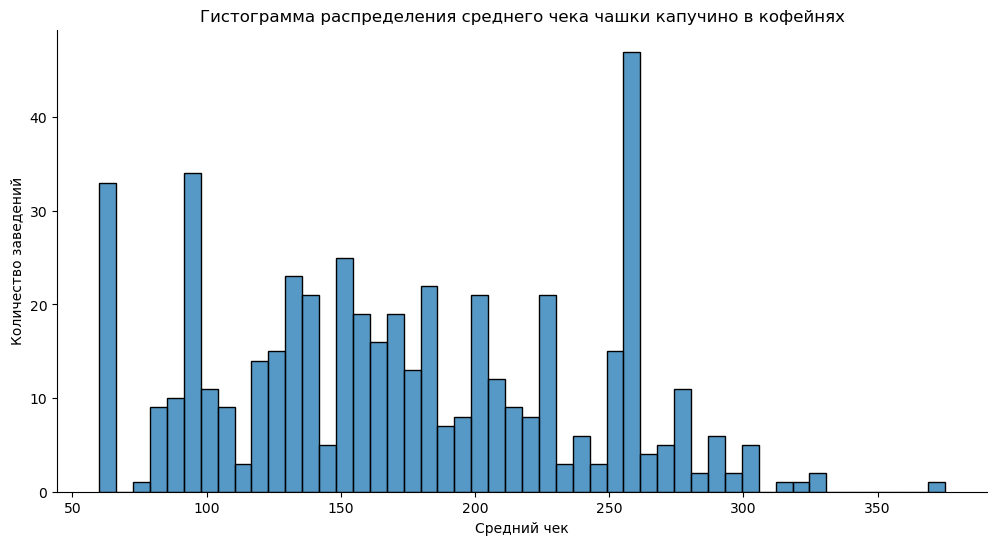

In [113]:
# построили гистограмму рапределения среднего чека чашки капучино кофейнях
plt.figure(figsize=(12, 6))

fig = sns.histplot(data=coffee_shops.query('middle_coffee_cup != -1'), 
             x='middle_coffee_cup',
             bins=50
            )
sns.despine()
#fig.axis(xmin=0, xmax=5000)
plt.title('Гистограмма распределения среднего чека чашки капучино в кофейнях')
plt.xlabel('Средний чек')
plt.ylabel('Количество заведений')
plt.grid(False)
plt.show()

In [114]:
# посмотрели на кофейни у которых выброс по среднему чеку
(coffee_shops
 .query('middle_coffee_cup > 250 and middle_coffee_cup <= 260')[['name', 'district']]
 .value_counts()
)

name                   district                               
шоколадница            Центральный административный округ         16
                       Западный административный округ             8
                       Северо-Восточный административный округ     5
                       Северный административный округ             4
                       Юго-Западный административный округ         3
                       Южный административный округ                3
                       Восточный административный округ            2
                       Северо-Западный административный округ      2
                       Юго-Восточный административный округ        2
bloom-n-brew           Центральный административный округ          1
carrots and beans      Западный административный округ             1
jeffrey's кофе и сидр  Северо-Восточный административный округ     1
кофе и мечты           Центральный административный округ          1
кофейня на остоженке   Центральный админ

Выброс из-за кофеен сети Шоколадница - большинство из-которых в Центральном административном округе.

<a id='3.5-bullet'></a>
### Вывод по разделу

Central Perk - кофейня, в которой друзья часто проводят время. Она расположена в районе Нью-Йорка Гринвич-Виллидж, в том же районе, где и квартира Моники.
Гринвич-Виллидж — зелёный район. В центре района находится известный парк на Вашингтон-сквер (Washington Square Park), вокруг которого сосредоточены учебные корпуса Нью-Йоркского университета. В районе много маленьких скверов, а также многочисленные спортивные площадки.

При открытии кофейни необходимо опираться на здравый смысл - целью любого бизнеса является получение прибыли.
Чтобы отбить затраты на аренду, расходные материалы, заплату сотрудников и налоги необходима достаточная проходимость места и хороший средний чек. 
Если ориентироваться на место кофейни из сериала - его можно поискать в Юго-западном административном округе, там высокая стоимость чашки капучино - 199 рублей и низкая концентрация кофеен в районе 100. Причем из топ-15 улиц с самым высоким чеком всего одно заведение из сети Шоколадница, с рейтингом заведения всего 4.1. Из топ-15 улиц с высоким рейтингом заведений там тоже всего 2 заведения. В Центральном административном округе заведений в 5 раз больше, что влияет на стоимость чашки - ее приходится снижать и место под саму кофейню будет сложно найти и у многих заведений высокий рейтинг.


<a id='4-bullet'></a>
## Презентация исследования для инвесторов 

Ссылка на презентацию https://disk.yandex.ru/i/MvrnmDddKwFzdg

<a id='5-bullet'></a>
## Вывод

Было получено обращение от инвесторов из фонда «Shut Up and Take My Money», которые решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Необходимо было подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. 

Для проведения исследования воспользовались данными с заведениями общественного питания Москвы, составленные на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. В датасете проведена работа по выявлению неявных дубликатов, проработаны пропуски и типы данных, предобработаны данные: добавлены столбцы с улицами и с обозначением, что заведение 24/7.

Далее провели анализ заведений общественного питания Москвы. Выявили, что в тройке лидеров заведения в категориях: кафе на первом месте - 2116 заведений, рестораны на втором месте - 1953 заведения, замыкают кофейни - 1358 заведений. Меньше всего заведений в категории булочные - всего 238 заведений. По количеству посадочных мест тройка лидеров уже немного другая: ресторан на первом месте - 86 посадочных мест, далее идут бары, пабы - 82 места и замыкают кофейни с 80 посадочными местами. Булочные также на последнем месте, всего посадочных мест - 50. При разделении заведений на сетевые и несетевые, последних оказалось больше - 61% от общего количества заведений. Чаще сетевыми завелениями становяться булочные - 63% от общего количества в категории, пиццерии - 52% сетевых и кофейни - 51% сетевых. Меньше всего сетевых заведений в категории бар, паб - там всего сетевых заведений 22%. Среди популярных сетей в Москве преобладают заведения в категориях: кофейня и пиццерия. Это знакомые нам сети: кофейня Шоколадница и пицеррии Домино'с пицца и Додо пицца. По числу заведений лидирует Центральный административный округ, отрыв более чем в 2 раза от остальных районов. Усредненные рейтинги не сильно различаются в разных типах общепита и в разных районах - рейтинг колеблеться в диапазоне 4.06-4.39. Можем наблюдать, что в западной части Москвы средний чек выше чем в восточной части. На юго-востоке самый низкий чек. Удаленность от центра Москвы влияет на средний чек не во всех районах. В разбивке улиц - больше всего заведений на проспекте Мира, преимущственно это кафе, кофейни или рестораны. 

При детализации исследования - открытие кофейни выяснили: кофеени составляют 17,2% от общего числа заведений. Больше всего их сосредоточено в Центральном административном округе, меньше всего Северо-Западном административном округе. Круглосуточные кофейни составлюят всего 4% от общего числа кофеен. Усредненные рейтинги в целом как и по всем заведениям колеблются в небольшом диапазоне: 4.19 - 4.34. При определении стоимости чашки капучино также ориентировались на район, в котором будет открыта кофейня. Высокий средний чек в Юго-Западном административном округе - 199 рублей, самый низкий в Восточном административном округе - 135 рублей.

В качестве рекомендации по поиску места для кофейни - стоит обратить внимание на Юго-западный административный округ, там высокая стоимость чашки капучино - 199 рублей и низкая концентрация кофеен в районе 100. Причем из топ-15 улиц с самым высоким чеком всего одно заведение из сети Шоколадница, с рейтингом заведения всего 4.1. Из топ-15 улиц с высоким рейтингом заведений там тоже всего 2 заведения. Также можно провести эксперимент по круглосуточной работе и посмотреть как это повлияет на выручку и посещаемость.

ТОП-3 аргумента в пользу СЗАО это:

- высокая стоимость чашки капучино - 199 рублей и низкая концентрация кофеен в районе 100;
- всего одно заведение из топ-15 улиц с самым высоким чеком;
- всего два заведения из топ-15 улиц с самым высоким рейтингом.